# All Variables Modelling

All variables are used to predict the Absorbance. 3 different models are used:
* linear regression
* random forest
* neural network

In [4]:
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.stats.outliers_influence import (
    variance_inflation_factor,
)

import statsmodels.api as sm

from quantile_forest import RandomForestQuantileRegressor

import xgboost as xgb
from lightgbm import LGBMRegressor

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection
from sklearn.model_selection import cross_validate, train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

# Hyperparameter Optimization
import optuna

# Neural Network
from sklearn.neural_network import MLPRegressor

# MAPiE
from mapie.regression import MapieRegressor
from mapie.metrics import regression_coverage_score


# SHAP
import shap

# Define paths

In [5]:
data_folder = os.path.join("..", "..", "data")

raw_data_folder = os.path.join(data_folder, "raw_data")

# Load dataset

In [6]:
full_df = pd.read_excel(
    os.path.join(raw_data_folder, "raw_full_dataset.xlsx")
)

In [7]:
full_df

,DateTime,nitrate,pH,turbidity,Ammonium,dissolvedoxygen,watertemperature,Conductivity,redoxpotential,ABS254,cumulated_rainfall_24h,flowriver,environmental_temperature
0,2012-08-29,5.54,8.31,3.42,0.01,4.71,28.10,1144.98,220.47,9.07,0.0,100.82,27.02
1,2012-08-30,5.56,8.29,3.10,0.02,4.75,27.57,1205.67,225.81,15.13,0.4,97.40,22.49
2,2012-08-31,5.51,8.31,3.60,0.04,5.08,26.37,1237.20,229.83,15.95,0.0,95.59,21.03
3,2012-09-01,5.49,8.40,4.00,0.06,5.68,25.04,1254.15,231.82,NaN,0.0,94.97,17.81
4,2012-09-02,5.39,8.43,3.97,0.15,5.98,24.75,1244.10,234.80,15.10,0.0,95.48,19.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4045,2023-09-26,7.56,8.30,3.96,0.03,5.46,25.95,1628.49,227.69,3.97,0.0,83.50,20.50
4046,2023-09-27,7.28,8.29,4.16,0.02,5.33,26.37,1610.67,227.02,3.81,0.0,81.17,21.76
4047,2023-09-28,7.34,8.27,3.80,0.02,5.23,26.60,1602.33,228.25,3.76,0.0,81.42,22.17
4048,2023-09-29,7.64,8.25,3.89,0.03,5.17,26.73,1613.81,230.54,4.18,0.0,80.71,22.03


In [8]:
full_df.rename(
    columns={
        "flowriver": "Flow River",
        "cumulated_rainfall_24h": "Daily Cumulated Rainfall",
        "environmental_temperature": "Air Temperature",
        "nitrate": "Nitrate",
        "dissolvedoxygen": "Dissolved Oxygen",
        "turbidity": "Turbidity",
        "watertemperature": "Water Temperature",
        "redoxpotential": "Redox Potential",
        "ABS254": "Absorbance 254nm",
    },
    inplace=True,
)

In [9]:
full_df.isna().sum()

DateTime                      0
Nitrate                     176
pH                           99
Turbidity                   218
Ammonium                    413
Dissolved Oxygen            325
Water Temperature            86
Conductivity                141
Redox Potential             273
Absorbance 254nm            551
Daily Cumulated Rainfall     10
Flow River                   46
Air Temperature               1
dtype: int64

In [10]:
full_df = full_df.dropna()

## Take the Monthly Average

In [11]:
full_df["Year"] = full_df["DateTime"].dt.year
full_df["Month"] = full_df["DateTime"].dt.month

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_4573/1126604800.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df['Year'] = full_df['DateTime'].dt.year
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_4573/1126604800.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df['Month'] = full_df['DateTime'].dt.month


In [12]:
# take the monthly average
monthly_avg_df = full_df.groupby(["Year", "Month"]).mean().reset_index()

In [13]:
full_df = monthly_avg_df

In [14]:
full_df["Season"] = full_df["Month"].apply(
    lambda x: "Winter"
    if x in [12, 1, 2]
    else "Spring"
    if x in [3, 4, 5]
    else "Summer"
    if x in [6, 7, 8]
    else "Autumn"
)

# convert Season to integer
full_df["Season"] = full_df["Season"].apply(
    lambda x: 1
    if x == "Winter"
    else 2
    if x == "Spring"
    else 3
    if x == "Summer"
    else 4
)

full_df["Timestamp"] = full_df["DateTime"].apply(
    lambda x: x.timestamp()
)

# Multicollinearity Test

In [9]:
X = full_df[full_df.columns.difference(["DateTime"])]


vif_test = pd.DataFrame()
vif_test["variable"] = X.columns
vif_test["VIF"] = [
    variance_inflation_factor(X.values, i) for i in range(X.shape[1])
]

In [9]:
vif_test

,variable,VIF
0,Absorbance 254nm,6.540941
1,Air Temperature,47.176356
2,Ammonium,3.173699
3,Conductivity,25.978670
4,Daily Cumulated Rainfall,1.069393
5,Dissolved Oxygen,48.783197
6,Flow River,7.219115
7,Nitrate,40.705111
8,Redox Potential,135.308202
9,Turbidity,3.208829


In [11]:
X = full_df[full_df.columns.difference(["DateTime"])]


vif_test = pd.DataFrame()
vif_test["variable"] = X.columns
vif_test["VIF"] = [
    variance_inflation_factor(X.values, i) for i in range(X.shape[1])
]

In [12]:
vif_test

,variable,VIF
0,Absorbance 254nm,2.848004
1,Air Temperature,9.194284
2,Ammonium,1.120169
3,Conductivity,2.567642
4,Daily Cumulated Rainfall,1.035261
5,Dissolved Oxygen,2.397270
6,Flow River,4.035563
7,Month,2.229043
8,Nitrate,1.914706
9,Redox Potential,1.271387


# Linear Regression

## All Features + Year

In [14]:
setting = "All Features + Year"

### Split Data

In [459]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [460]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2022-01-01"]
X_test = X[X["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [461]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [462]:
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### With available future projections

#### Train Model

In [463]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [464]:
results = model.summary2()

#### Results

In [465]:
print(results)

                     Results: Ordinary least squares
Model:                OLS                Adj. R-squared:       0.599     
Dependent Variable:   y                  AIC:                  12603.3425
Date:                 2024-03-18 18:08   BIC:                  12677.1607
No. Observations:     2161               Log-Likelihood:       -6288.7   
Df Model:             12                 F-statistic:          269.9     
Df Residuals:         2148               Prob (F-statistic):   0.00      
R-squared:            0.601              Scale:                19.852    
-------------------------------------------------------------------------
                          Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------
const                    12.4422   0.0958 129.8138 0.0000 12.2542 12.6301
Air Temperature          -0.1263   0.2681  -0.4712 0.6376 -0.6520  0.3994
Ammonium                  0.5131   0.1000   5.1289 0.0000  

#### Predictions

In [466]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [467]:
train_res = model.resid

#### Plots

In [468]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 2.6797321914673327
R2: 0.4328635640682039


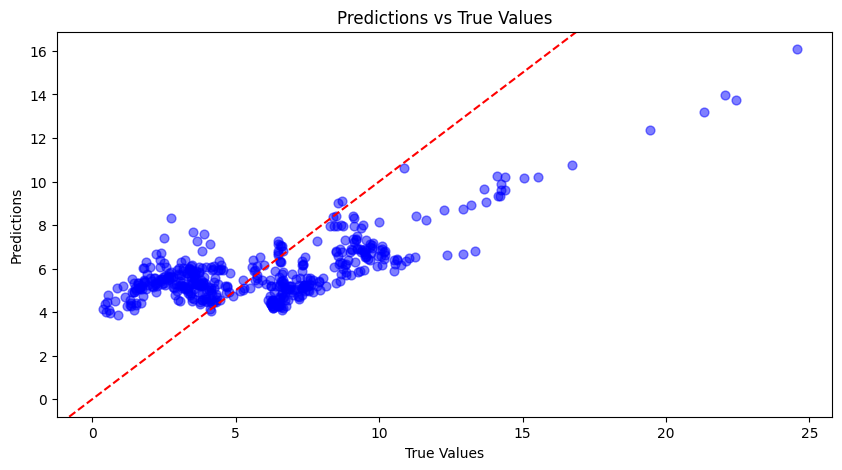

In [469]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

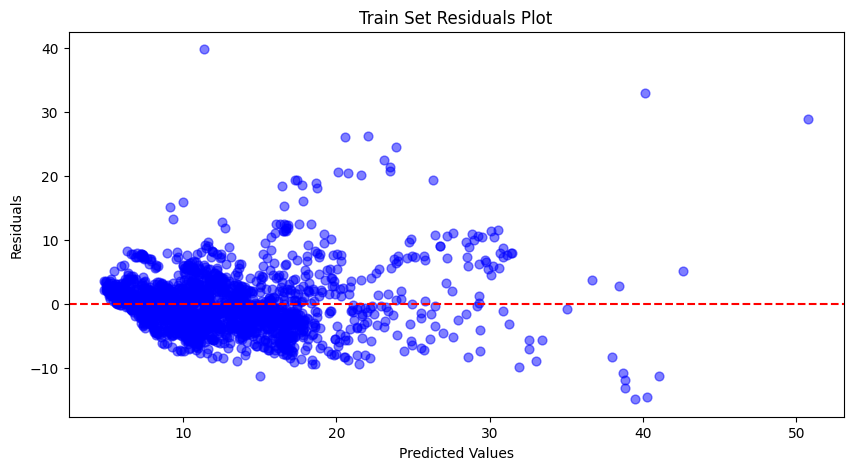

In [470]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(model.fittedvalues, train_res, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Train Set Residuals Plot")
plt.show()

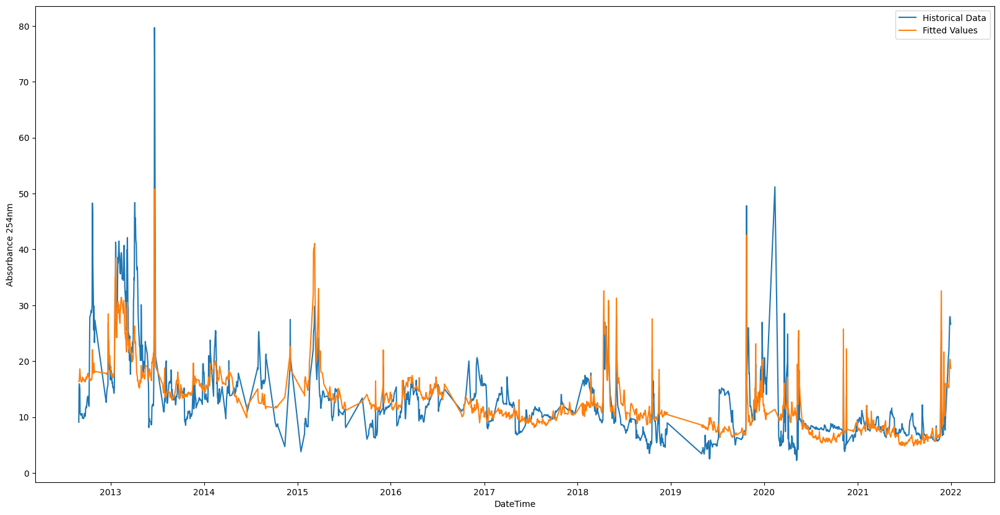

In [471]:
# plot the fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"],
    y=model.fittedvalues.values,
    label="Fitted Values",
)

plt.show()

In [472]:
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)

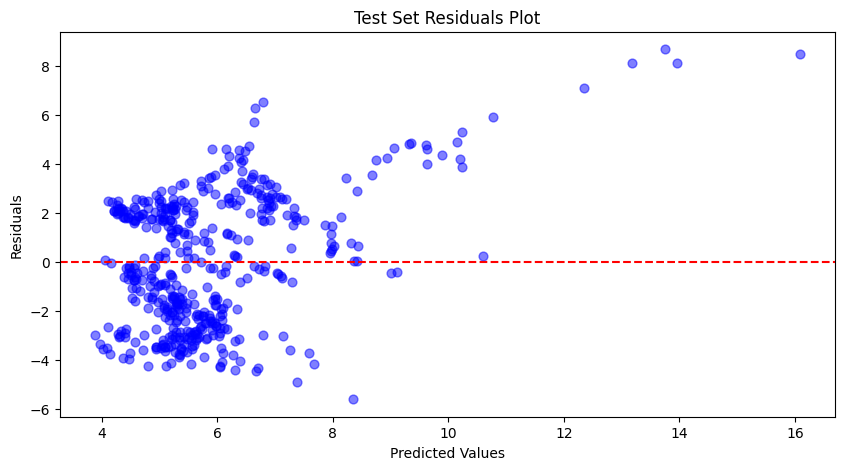

In [473]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

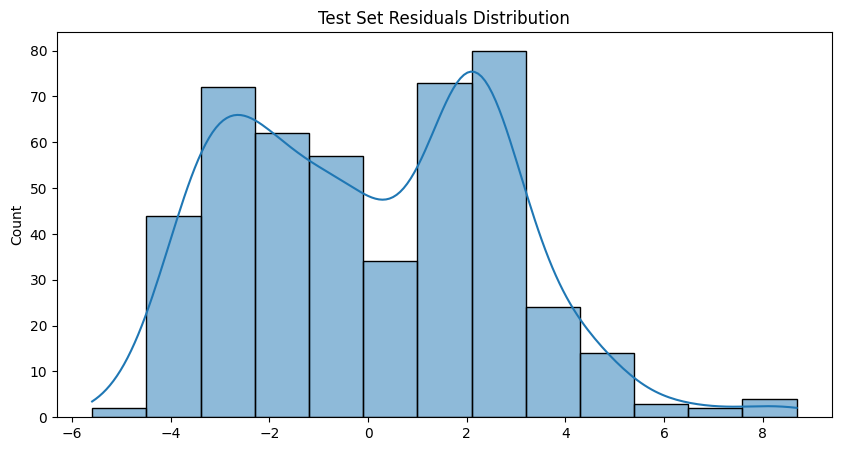

In [474]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

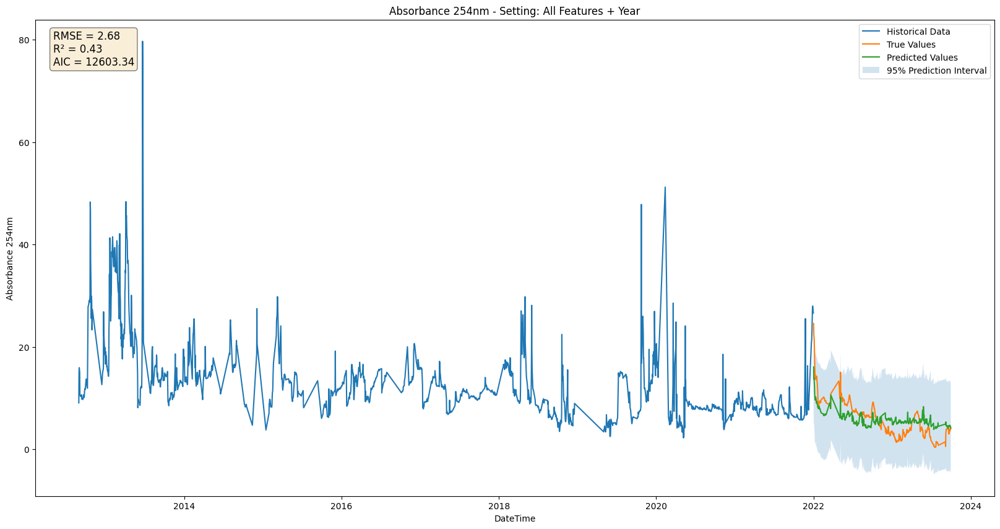

In [475]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
# sns.lineplot(x=y_train['DateTime'], y=model.fittedvalues.values, label='Fitted Values')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

#### Store Results

In [476]:
lr_pred = predictions["mean"]
lr_lower_bound = predictions["obs_ci_lower"]
lr_upper_bound = predictions["obs_ci_upper"]
lr_rmse = rmse
lr_r2 = r2

### Backward Feature Selection

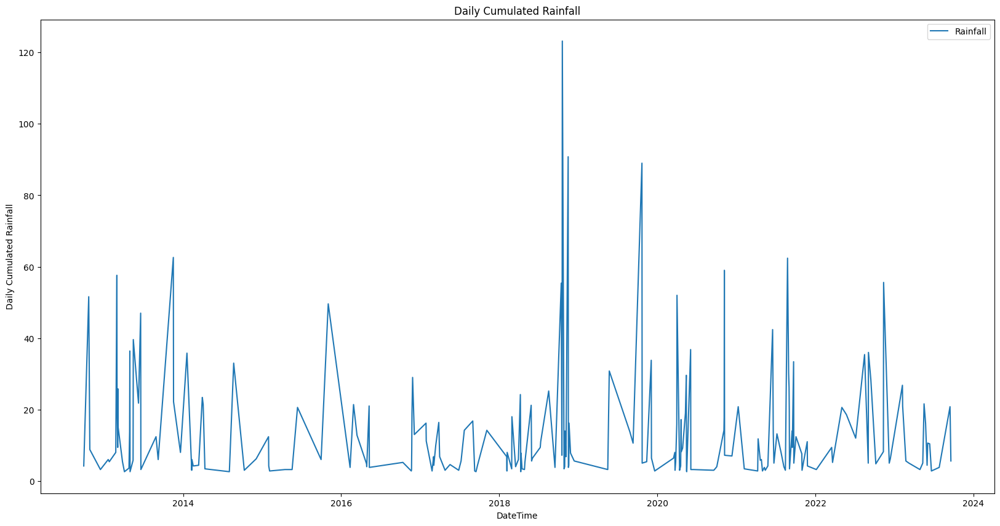

In [397]:
from sklearn.preprocessing import MinMaxScaler


plt.figure(figsize=(20, 10))

scaled_rainfall = scaler.fit_transform(
    X["Daily Cumulated Rainfall"].values.reshape(-1, 1)
)
# get only > 0 rainfall
scaled_rainfall = pd.DataFrame(
    X["Daily Cumulated Rainfall"], columns=["Daily Cumulated Rainfall"]
)
scaled_rainfall["DateTime"] = X["DateTime"]
scaled_rainfall = scaled_rainfall[
    scaled_rainfall["Daily Cumulated Rainfall"] > 2.5
]

# scale min-max
# scaler = MinMaxScaler()

# scaled_rainfall['Daily Cumulated Rainfall'] = scaler.fit_transform(scaled_rainfall['Daily Cumulated Rainfall'].values.reshape(-1, 1))


sns.lineplot(
    x=scaled_rainfall["DateTime"],
    y=scaled_rainfall["Daily Cumulated Rainfall"],
    label="Rainfall",
)

plt.xlabel("DateTime")
plt.ylabel("Daily Cumulated Rainfall")

plt.title(f"Daily Cumulated Rainfall")

plt.legend()
plt.show()

In [398]:
import statsmodels.tsa.api as smt
from statsmodels.tsa.seasonal import seasonal_decompose

In [399]:
scaled_rainfall.set_index("DateTime", inplace=True)

In [400]:
result = seasonal_decompose(
    scaled_rainfall,
    model="additive",
    extrapolate_trend="freq",
    period=30,
)
trend = result.trend

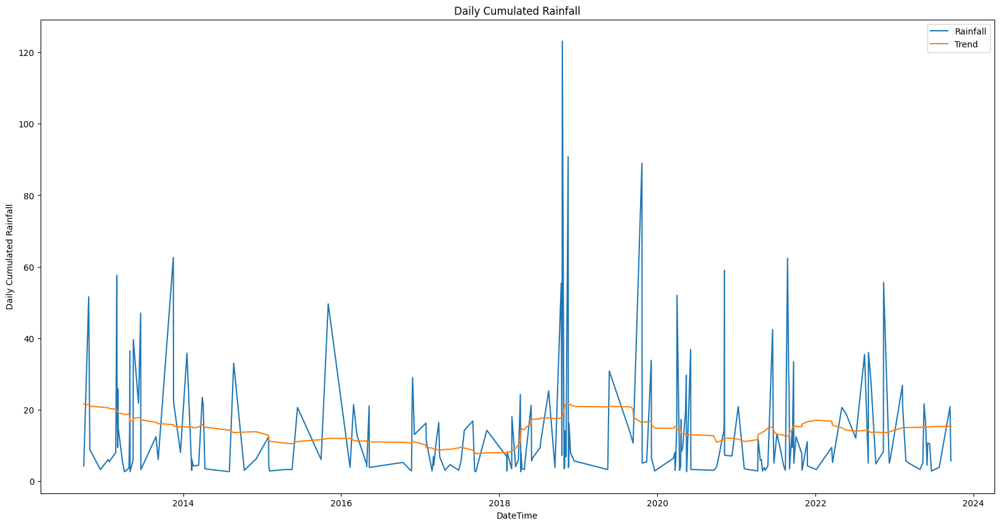

In [401]:
plt.figure(figsize=(20, 10))

sns.lineplot(
    x=scaled_rainfall.index,
    y=scaled_rainfall["Daily Cumulated Rainfall"],
    label="Rainfall",
)
sns.lineplot(x=scaled_rainfall.index, y=trend.values, label="Trend")

plt.xlabel("DateTime")
plt.ylabel("Daily Cumulated Rainfall")

plt.title(f"Daily Cumulated Rainfall")


plt.legend()
plt.show()

In [402]:
def backward_feature_selection(
    X_tr, y_tr, X_ts, y_ts, pvalue_threshold=0.05
):
    # remove multicollinearity variables
    drop_columns = ["Air Temperature"]

    X_tr = X_tr.drop(columns=drop_columns)
    X_ts = X_ts.drop(columns=drop_columns)

    initial_list = list(X_tr.columns)
    included = list(X_tr.columns)

    summaries = {}
    results = {}
    bfs_insights = {}
    index = 0
    excluded_variable = None

    changed = True

    while True:
        changed = False

        # Fit the regression model
        model = sm.OLS(
            y_tr.values, sm.add_constant(X_tr[included])
        ).fit()
        result = {}

        # PREDICTION STEP
        predictions = model.get_prediction(
            sm.add_constant(X_ts[included])
        ).summary_frame(alpha=0.05)

        train_res = model.resid

        rmse = np.sqrt(mean_squared_error(y_ts, predictions["mean"]))
        r2 = r2_score(y_ts, predictions["mean"])

        residuals = (
            y_ts["Absorbance 254nm"].values - predictions["mean"].values
        )

        model.aic
        #### Store Results

        result["y_pred"] = predictions["mean"]
        result["y_lower_bound"] = predictions["obs_ci_lower"]
        result["y_upper_bound"] = predictions["obs_ci_upper"]

        result["train_res"] = train_res
        result["residuals"] = residuals

        result["rmse"] = rmse
        result["r2"] = r2
        result["aic"] = model.aic

        result["model"] = model

        results[index] = result

        # FEATURE SELECTION STEP
        index += 1

        # Get the pvalues of the model
        pvalues = model.pvalues

        insights = pd.DataFrame(
            {
                "step": index,
                "n_features": [len(included)] * len(initial_list),
                "features": [included] * len(initial_list),
                "dropped_feature": excluded_variable,
            }
        )

        bfs_insights[index] = insights
        summaries[index] = model.summary2()

        # Find the variable with the highest pvalue
        highest_pvalue = pvalues.max()
        if highest_pvalue >= pvalue_threshold:
            changed = True
            excluded_variable = pvalues.idxmax()
            included.remove(excluded_variable)

        if not changed:
            break

    return results, summaries, bfs_insights

In [403]:
results, summaries, bfs_insights = backward_feature_selection(
    X_train_fit,
    y_train_fit,
    X_test_fit,
    y_test_fit,
    pvalue_threshold=0.05,
)

KeyError: "['Air Temperature'] not found in axis"

#### Results

In [ ]:
# show the insights and summaries of the backward feature selection
for i in summaries.keys():
    step = bfs_insights[i]["step"].iloc[0]
    print(f"================= Step {step} =================")
    print()
    print(f"N Features: {bfs_insights[step]['n_features'].iloc[0]}")
    print(f"Features: {bfs_insights[step]['features'].iloc[0]}")
    print(
        f"Dropped Feature: {bfs_insights[step]['dropped_feature'].iloc[0]}"
    )

    print()
    print(summaries[i])
    print("\n")

#### Plots

In [ ]:
# rmse = np.sqrt(mean_squared_error(y_test_fit, predictions['mean']))
# r2 = r2_score(y_test_fit, predictions['mean'])

In [ ]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

In [ ]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - predictions["mean"]
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot")
plt.show()

In [ ]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Residuals Distribution")
plt.show()

In [ ]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
# sns.lineplot(x=y_train['DateTime'], y=model.fittedvalues.values, label='Fitted Values')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"],
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

#### Store Results

In [ ]:
# lr_pred = predictions['mean']
# lr_lower_bound = predictions['obs_ci_lower']
# lr_upper_bound = predictions['obs_ci_upper']
# lr_rmse = rmse
# lr_r2 = r2

## All Features + Year w/ log(y)

In [477]:
setting = "Ammonium + Flow River + Redox Potential + Turbidity + Year"

### Split Data

In [478]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

# scale y to ln(y)
y["Absorbance 254nm"] = np.log(y["Absorbance 254nm"])

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/122478304.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['Absorbance 254nm'] = np.log(y['Absorbance 254nm'])


In [479]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2022-01-01"]
X_test = X[X["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [480]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

# scale the data
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

In [481]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [482]:
results = model.summary2()

### Results

In [483]:
print(results)

                     Results: Ordinary least squares
Model:                 OLS                Adj. R-squared:       0.562    
Dependent Variable:    y                  AIC:                  1135.1758
Date:                  2024-03-18 18:08   BIC:                  1208.9940
No. Observations:      2161               Log-Likelihood:       -554.59  
Df Model:              12                 F-statistic:          231.9    
Df Residuals:          2148               Prob (F-statistic):   0.00     
R-squared:             0.564              Scale:                0.098414 
-------------------------------------------------------------------------
                          Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------
const                     2.4011   0.0067 355.8090 0.0000  2.3879  2.4144
Air Temperature          -0.0015   0.0189  -0.0781 0.9378 -0.0385  0.0355
Ammonium                  0.0408   0.0070   5.7867 0.0000  

### Predictions

In [484]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [485]:
predictions

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,2.485446,0.041144,2.404759,2.566133,1.864971,3.105921
1,2.359826,0.039120,2.283109,2.436542,1.739854,2.979797
2,2.373016,0.035282,2.303826,2.442207,1.753931,2.992102
3,2.328463,0.032750,2.264238,2.392688,1.709913,2.947013
4,2.285782,0.030726,2.225526,2.346038,1.667631,2.903932
...,...,...,...,...,...,...
466,1.695993,0.036152,1.625096,1.766890,1.076715,2.315271
467,1.682174,0.036207,1.611169,1.753178,1.062883,2.301464
468,1.673774,0.035780,1.603607,1.743940,1.054578,2.292969
469,1.681154,0.035283,1.611962,1.750345,1.062068,2.300239


In [486]:
# rescale the data
y_train["Absorbance 254nm"] = np.exp(y_train["Absorbance 254nm"])
y_test["Absorbance 254nm"] = np.exp(y_test["Absorbance 254nm"])
y_test_fit = np.exp(y_test_fit)

predictions["mean"] = np.exp(predictions["mean"])
predictions["obs_ci_lower"] = np.exp(predictions["obs_ci_lower"])
predictions["obs_ci_upper"] = np.exp(predictions["obs_ci_upper"])

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/1204093844.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['Absorbance 254nm'] = np.exp(y_train['Absorbance 254nm'])
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/1204093844.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test['Absorbance 254nm'] = np.exp(y_test['Absorbance 254nm'])


### Plots

In [487]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 3.106325345704737
R2: 0.23792337067872893


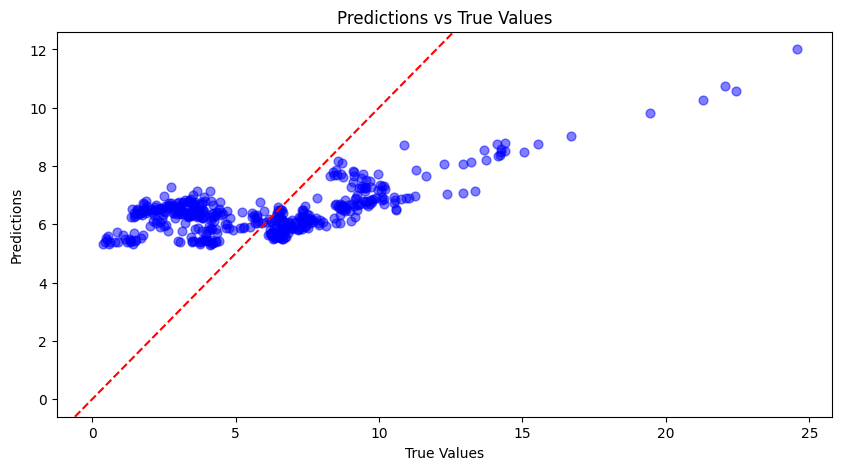

In [488]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

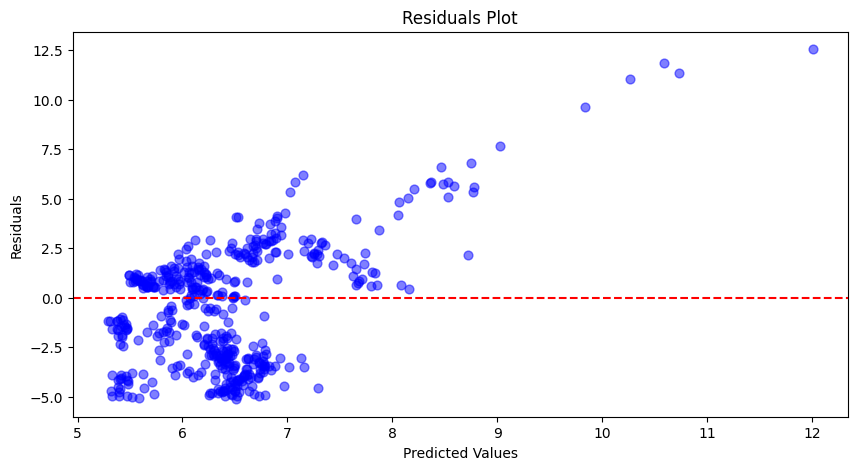

In [489]:
# plot the residuals
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot")
plt.show()

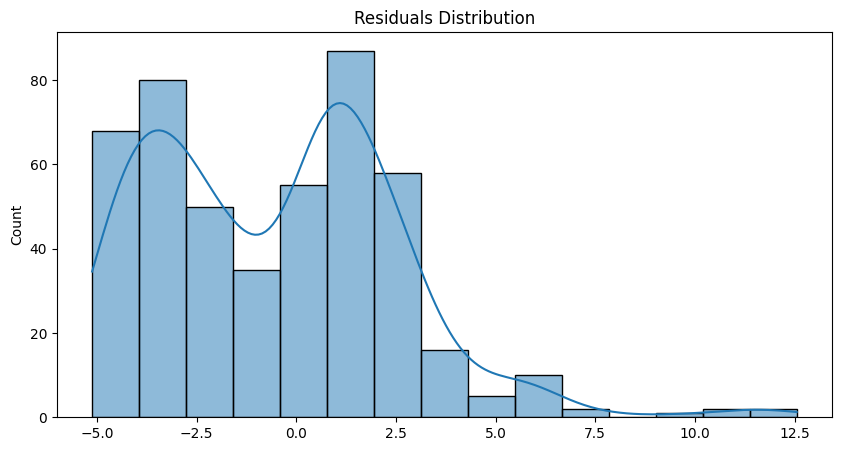

In [490]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Residuals Distribution")
plt.show()

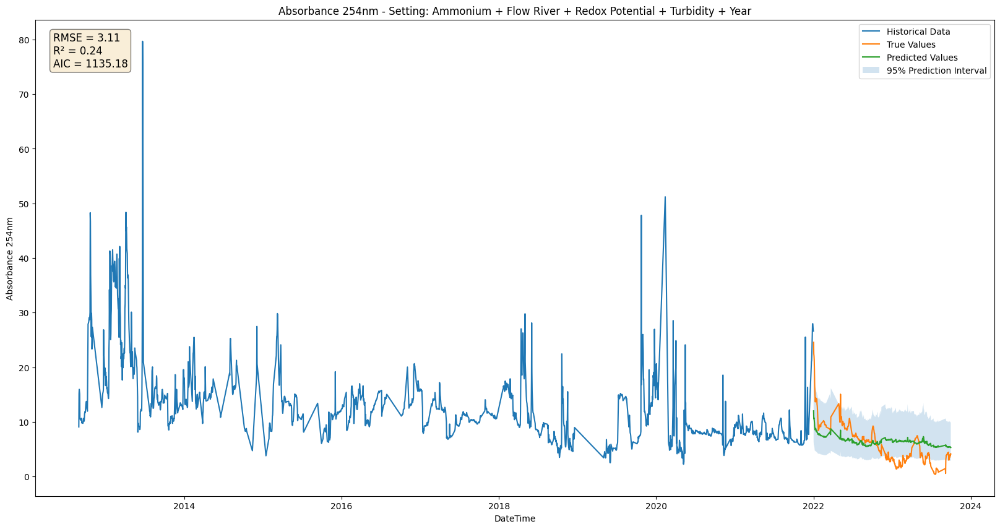

In [491]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

### Store Results

In [492]:
log_pred = predictions["mean"]
log_lower_bound = predictions["obs_ci_lower"]
log_upper_bound = predictions["obs_ci_upper"]
log_rmse = rmse
log_r2 = r2

## All Features + Year + Polynomial Features

### Split Data

In [493]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [494]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"] + further_features)]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"] + further_features)
    ),
)

X_poly["DateTime"] = X["DateTime"].values

X_poly[further_features] = X[further_features].values

In [495]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2022-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [496]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [497]:
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(
    X_train_fit[X_train_fit.columns.difference(further_features)]
)
X_test_fit = scaler.transform(
    X_test_fit[X_test_fit.columns.difference(further_features)]
)

X_train_fit = pd.DataFrame(
    X_train_fit,
    columns=X_train.columns.difference(["DateTime"] + further_features),
)
X_test_fit = pd.DataFrame(
    X_test_fit,
    columns=X_test.columns.difference(["DateTime"] + further_features),
)

X_train_fit[further_features] = X_train[further_features].values
X_test_fit[further_features] = X_test[further_features].values

### Train Model

In [498]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [499]:
results = model.summary2()

### Results

In [500]:
print(results)

                                 Results: Ordinary least squares
Model:                        OLS                        Adj. R-squared:               0.747     
Dependent Variable:           y                          AIC:                          11671.8787
Date:                         2024-03-18 18:08           BIC:                          12120.4665
No. Observations:             2161                       Log-Likelihood:               -5756.9   
Df Model:                     78                         F-statistic:                  82.80     
Df Residuals:                 2082                       Prob (F-statistic):           0.00      
R-squared:                    0.756                      Scale:                        12.521    
-------------------------------------------------------------------------------------------------
                                             Coef.   Std.Err.    t     P>|t|    [0.025    0.975] 
-----------------------------------------------------

### Predictions

In [501]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [502]:
train_res = model.resid

### Plots

In [503]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 4.716615104238376
R2: -0.7569752250523314


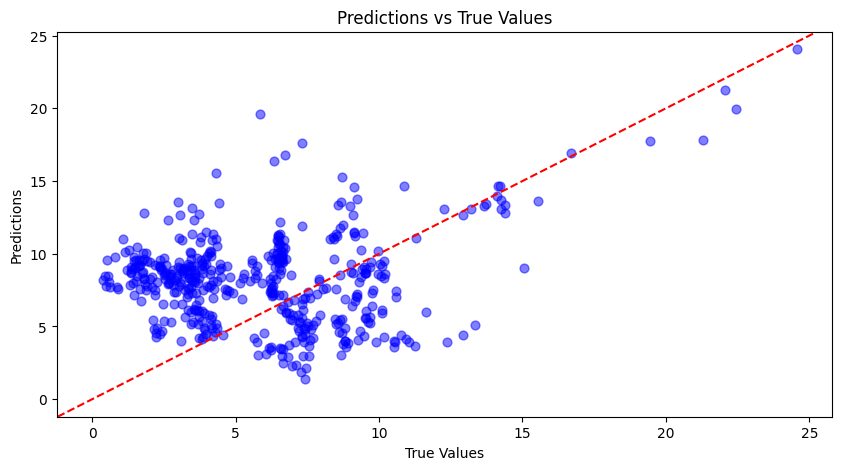

In [504]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

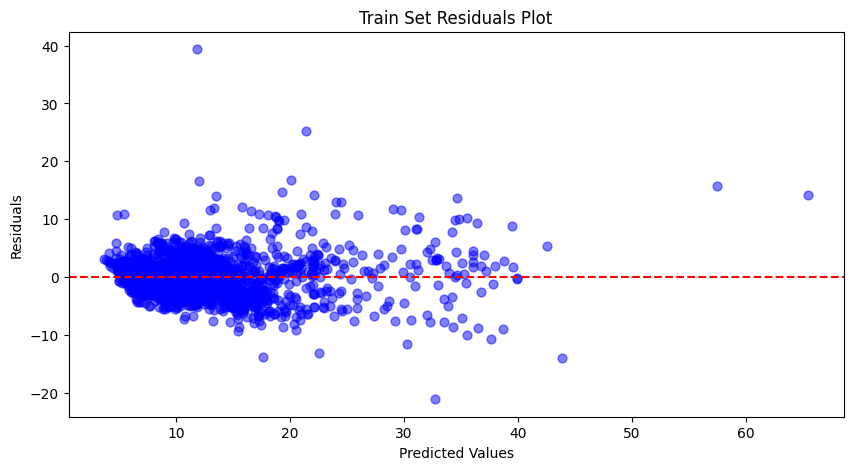

In [505]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(model.fittedvalues, train_res, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Train Set Residuals Plot")
plt.show()

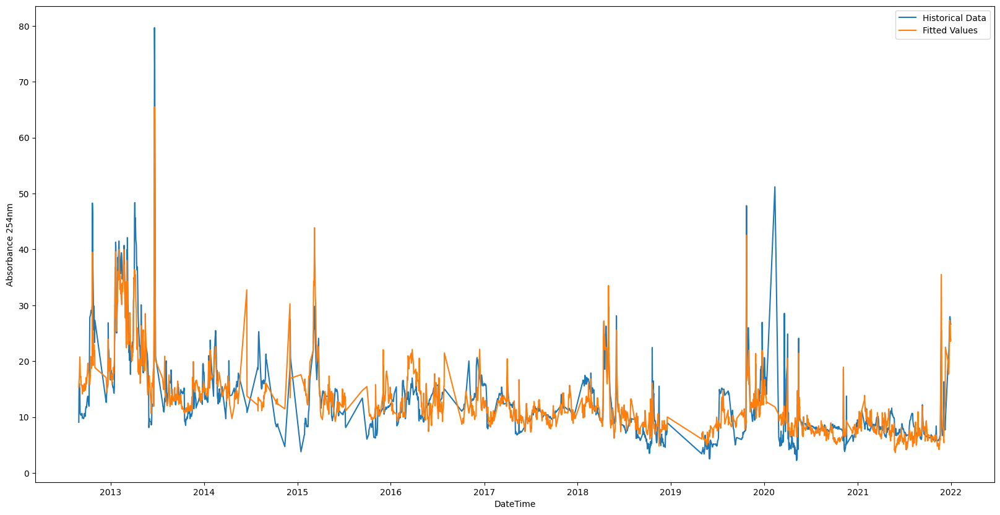

In [506]:
# plot the fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"],
    y=model.fittedvalues.values,
    label="Fitted Values",
)

plt.show()

In [507]:
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)

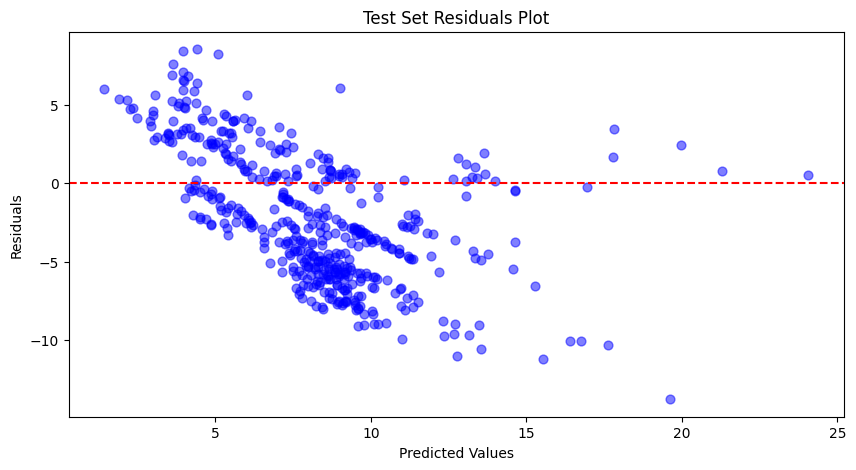

In [508]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

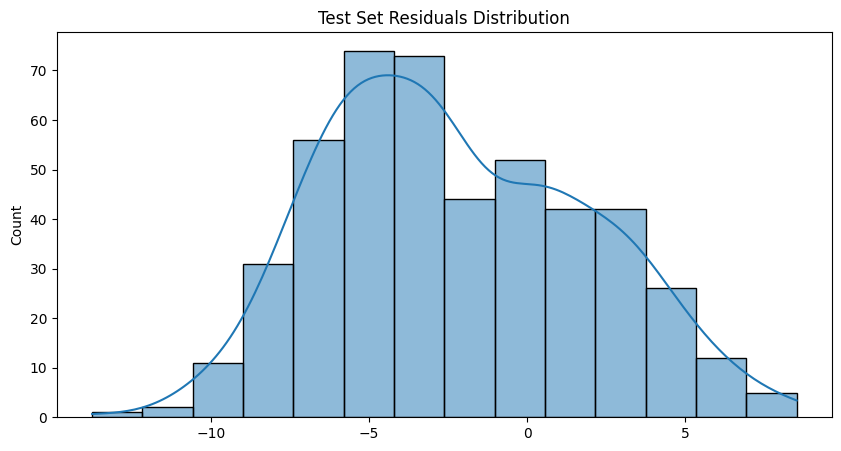

In [509]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

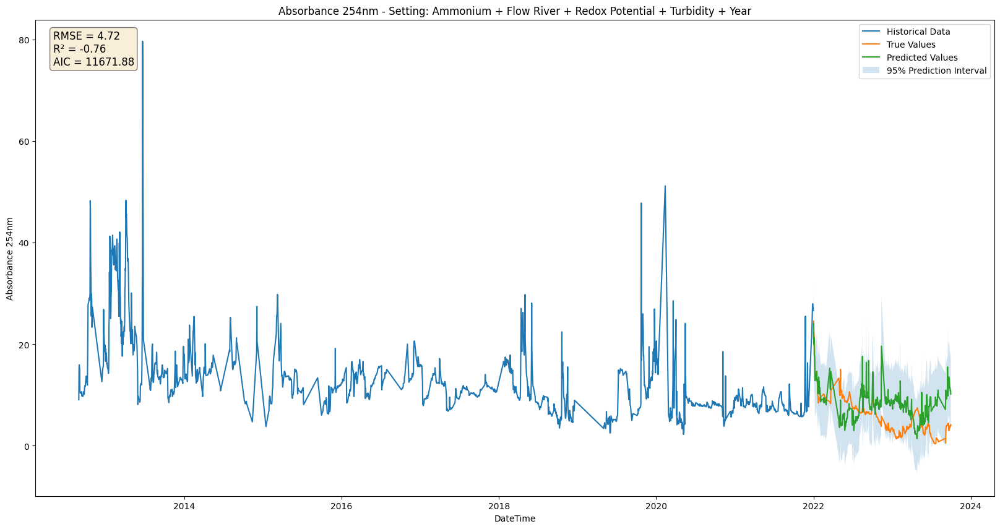

In [510]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
# sns.lineplot(x=y_train['DateTime'], y=model.fittedvalues.values, label='Fitted Values')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

### Store Results

In [511]:
poly_pred = predictions["mean"]
poly_lower_bound = predictions["obs_ci_lower"]
poly_upper_bound = predictions["obs_ci_upper"]
poly_rmse = rmse
poly_r2 = r2

## Final Plot

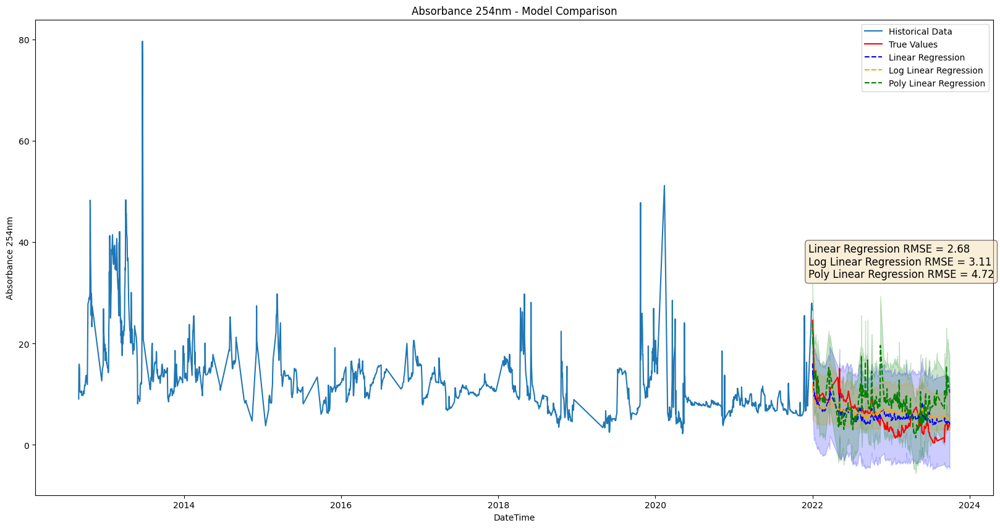

In [512]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=lr_pred.values,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    lr_lower_bound,
    lr_upper_bound,
    alpha=0.2,
    color="blue",
)

# Linear Regression Log
sns.lineplot(
    x=y_test["DateTime"],
    y=log_pred.values,
    label="Log Linear Regression",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    log_lower_bound,
    log_upper_bound,
    alpha=0.2,
    color="orange",
)

# Linear Regression Poly
sns.lineplot(
    x=y_test["DateTime"],
    y=poly_pred.values,
    label="Poly Linear Regression",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    poly_lower_bound,
    poly_upper_bound,
    alpha=0.2,
    color="green",
)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"Linear Regression RMSE = {lr_rmse:.2f}",
        f"Log Linear Regression RMSE = {log_rmse:.2f}",
        f"Poly Linear Regression RMSE = {poly_rmse:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    33,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Model Comparison")

plt.legend()
plt.show()

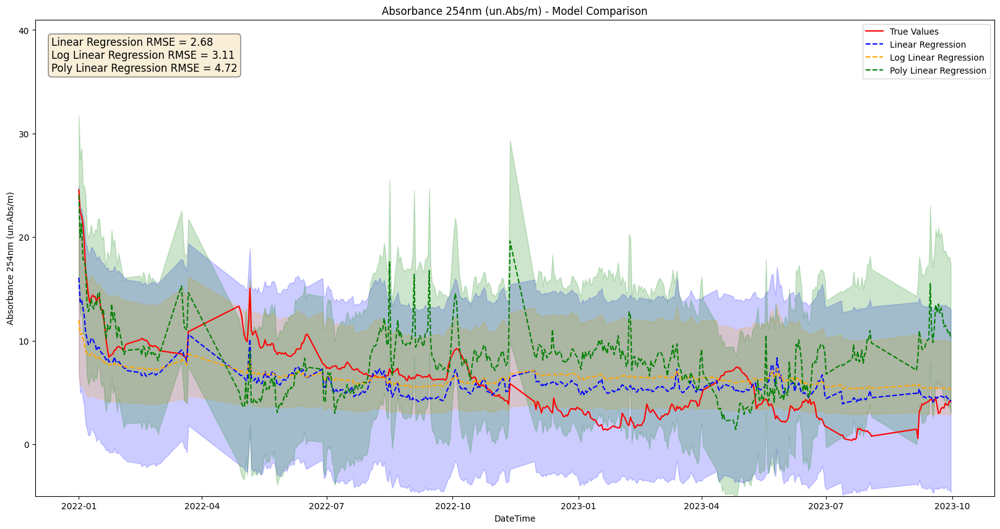

In [513]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
# sns.lineplot(x=y_train['DateTime'], y=y_train['Absorbance 254nm'], label='Historical Data')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=lr_pred.values,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    lr_lower_bound,
    lr_upper_bound,
    alpha=0.2,
    color="blue",
)

# Linear Regression Log
sns.lineplot(
    x=y_test["DateTime"],
    y=log_pred.values,
    label="Log Linear Regression",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    log_lower_bound,
    log_upper_bound,
    alpha=0.2,
    color="orange",
)

# Linear Regression Poly
sns.lineplot(
    x=y_test["DateTime"],
    y=poly_pred.values,
    label="Poly Linear Regression",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    poly_lower_bound,
    poly_upper_bound,
    alpha=0.2,
    color="green",
)

# change the y range to see the differences
plt.ylim(-5, 41)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm (un.Abs/m)")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"Linear Regression RMSE = {lr_rmse:.2f}",
        f"Log Linear Regression RMSE = {log_rmse:.2f}",
        f"Poly Linear Regression RMSE = {poly_rmse:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    36,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm (un.Abs/m) - Model Comparison")

plt.legend()
plt.show()

# Random Forest

In [76]:
setting = "All Features + Year"

### Split Data

In [186]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Air Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [187]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [188]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [189]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Perform Hyperparameter Tuning

In [190]:
from sklearn import model_selection


def objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 2, 70, 2)
    max_depth = trial.suggest_int("max_depth", 5, 20, 1)
    max_features = trial.suggest_int(
        "max_features", 1, X_train_fit.shape[1], 1
    )
    min_samples_split = trial.suggest_int("min_samples_split", 2, 10, 1)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10, 1)
    criterion = trial.suggest_categorical(
        "criterion",
        ["squared_error", "absolute_error", "friedman_mse", "poisson"],
    )
    model = RandomForestQuantileRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        max_features=max_features,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        criterion=criterion,
        random_state=42,
    )

    cv = model_selection.KFold(n_splits=5)
    results = model_selection.cross_val_score(
        estimator=model,
        X=X_train_fit,
        y=y_train_fit.values,
        cv=cv,
        scoring="neg_mean_squared_error",
    )
    return results.mean()

In [191]:
study = optuna.create_study(
    direction="maximize",
    storage="sqlite:///RandomForest.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(
    objective,
    n_trials=100,
    show_progress_bar=True,
)

[I 2024-03-18 15:59:34,906] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year', 'Season']' instead of creating a new one.


  0%|          | 0/100 [00:00<?, ?it/s]

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/2025355370.py:6: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  n_estimators = trial.suggest_int("n_estimators", 2, 70, 2)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/2025355370.py:7: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  max_depth = trial.suggest_int("max_depth", 5, 20, 1)
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/2025355370.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  max_features = trial.suggest_int(
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/2025355370.py:11: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  min_samples_split = trial

[I 2024-03-18 15:59:35,827] Trial 100 finished with value: -33.34571287112989 and parameters: {'n_estimators': 30, 'max_depth': 14, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 100 with value: -33.34571287112989.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:36,567] Trial 101 finished with value: -33.28635634982152 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:37,300] Trial 102 finished with value: -33.28635634982152 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:38,065] Trial 103 finished with value: -33.28635634982152 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:38,823] Trial 104 finished with value: -33.28635634982152 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:39,504] Trial 105 finished with value: -34.02608378888322 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:40,134] Trial 106 finished with value: -34.39150431722153 and parameters: {'n_estimators': 24, 'max_depth': 14, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:40,783] Trial 107 finished with value: -34.02608378888322 and parameters: {'n_estimators': 26, 'max_depth': 14, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:41,404] Trial 108 finished with value: -34.39150431722153 and parameters: {'n_estimators': 24, 'max_depth': 14, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:42,013] Trial 109 finished with value: -36.26356226251183 and parameters: {'n_estimators': 24, 'max_depth': 14, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:42,467] Trial 110 finished with value: -35.78123935375538 and parameters: {'n_estimators': 18, 'max_depth': 14, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:43,102] Trial 111 finished with value: -34.5837739937714 and parameters: {'n_estimators': 24, 'max_depth': 15, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:43,777] Trial 112 finished with value: -33.9585164977781 and parameters: {'n_estimators': 26, 'max_depth': 15, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:44,460] Trial 113 finished with value: -33.96498205033875 and parameters: {'n_estimators': 26, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:45,102] Trial 114 finished with value: -35.44955253598747 and parameters: {'n_estimators': 26, 'max_depth': 16, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:45,642] Trial 115 finished with value: -33.90911164216507 and parameters: {'n_estimators': 20, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:46,175] Trial 116 finished with value: -33.90911164216507 and parameters: {'n_estimators': 20, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:46,675] Trial 117 finished with value: -35.50978250200335 and parameters: {'n_estimators': 20, 'max_depth': 16, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:47,413] Trial 118 finished with value: -33.85825131328768 and parameters: {'n_estimators': 28, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:48,084] Trial 119 finished with value: -35.557018701646385 and parameters: {'n_estimators': 28, 'max_depth': 17, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:48,817] Trial 120 finished with value: -33.85825131328768 and parameters: {'n_estimators': 28, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:49,554] Trial 121 finished with value: -33.85825131328768 and parameters: {'n_estimators': 28, 'max_depth': 16, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/vir

[I 2024-03-18 15:59:49,853] Trial 122 finished with value: -37.329063442084944 and parameters: {'n_estimators': 28, 'max_depth': 16, 'max_features': 2, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:50,433] Trial 123 finished with value: -34.39505750990748 and parameters: {'n_estimators': 22, 'max_depth': 15, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:51,199] Trial 124 finished with value: -33.646502441866396 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:51,942] Trial 125 finished with value: -33.646502441866396 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:52,684] Trial 126 finished with value: -33.65419105372623 and parameters: {'n_estimators': 30, 'max_depth': 17, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:53,396] Trial 127 finished with value: -35.234729873898154 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'friedman_mse'}. Best is trial 101 with value: -33.28635634982152.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:54,170] Trial 128 finished with value: -31.636243072157065 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 128 with value: -31.636243072157065.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:54,837] Trial 129 finished with value: -34.758450873133235 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 9, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 128 with value: -31.636243072157065.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:55,557] Trial 130 finished with value: -31.519284813615506 and parameters: {'n_estimators': 28, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:56,276] Trial 131 finished with value: -31.519284813615506 and parameters: {'n_estimators': 28, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:56,998] Trial 132 finished with value: -31.519284813615506 and parameters: {'n_estimators': 28, 'max_depth': 18, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:57,742] Trial 133 finished with value: -34.45166275307788 and parameters: {'n_estimators': 30, 'max_depth': 18, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 15:59:58,459] Trial 134 finished with value: -31.595780056203115 and parameters: {'n_estimators': 28, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/vir

[I 2024-03-18 15:59:59,273] Trial 135 finished with value: -31.689528152946746 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:00,098] Trial 136 finished with value: -33.93948629635026 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 10, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:00,906] Trial 137 finished with value: -31.698933072157065 and parameters: {'n_estimators': 30, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:01,756] Trial 138 finished with value: -31.689528152946746 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:02,557] Trial 139 finished with value: -31.682261441356452 and parameters: {'n_estimators': 32, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:03,433] Trial 140 finished with value: -32.78684100131129 and parameters: {'n_estimators': 32, 'max_depth': 20, 'max_features': 12, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:03,912] Trial 141 finished with value: -36.282721528374736 and parameters: {'n_estimators': 32, 'max_depth': 20, 'max_features': 5, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:04,807] Trial 142 finished with value: -32.827339923144166 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 12, 'min_samples_split': 2, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:05,736] Trial 143 finished with value: -32.827339923144166 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 12, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:06,583] Trial 144 finished with value: -31.682261441356452 and parameters: {'n_estimators': 32, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:07,467] Trial 145 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:08,372] Trial 146 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:09,160] Trial 147 finished with value: -34.070841172652436 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:09,853] Trial 148 finished with value: -36.48356816179792 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 8, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'poisson'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:10,690] Trial 149 finished with value: -31.689528152946746 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:11,507] Trial 150 finished with value: -34.070841172652436 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:12,319] Trial 151 finished with value: -31.689528152946746 and parameters: {'n_estimators': 32, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:13,215] Trial 152 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 130 with value: -31.519284813615506.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:14,143] Trial 153 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:15,069] Trial 154 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:15,977] Trial 155 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:25,269] Trial 156 finished with value: -37.94649622062359 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'absolute_error'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:26,164] Trial 157 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:27,052] Trial 158 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:27,876] Trial 159 finished with value: -33.98993812730386 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:28,733] Trial 160 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:29,579] Trial 161 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:30,469] Trial 162 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:31,309] Trial 163 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:32,162] Trial 164 finished with value: -31.654658805747793 and parameters: {'n_estimators': 34, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:33,043] Trial 165 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:33,925] Trial 166 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/vir

[I 2024-03-18 16:00:34,749] Trial 167 finished with value: -33.98993812730386 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:35,675] Trial 168 finished with value: -31.49697307397829 and parameters: {'n_estimators': 38, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:36,606] Trial 169 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:37,532] Trial 170 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:38,462] Trial 171 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:39,401] Trial 172 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:40,333] Trial 173 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:41,263] Trial 174 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:42,129] Trial 175 finished with value: -34.49730043971734 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:43,135] Trial 176 finished with value: -33.890207987870625 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 8, 'criterion': 'poisson'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:44,067] Trial 177 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:45,001] Trial 178 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:45,929] Trial 179 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:56,957] Trial 180 finished with value: -37.2811619645589 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 1, 'criterion': 'absolute_error'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:57,928] Trial 181 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_81944/2025355370.py:12: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10, 1)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/s

[I 2024-03-18 16:00:58,870] Trial 182 finished with value: -31.503616254571277 and parameters: {'n_estimators': 38, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:00:59,759] Trial 183 finished with value: -31.21544925413419 and parameters: {'n_estimators': 36, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:01,079] Trial 184 finished with value: -34.77667850513586 and parameters: {'n_estimators': 36, 'max_depth': 19, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 2, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:01,971] Trial 185 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:02,947] Trial 186 finished with value: -31.773340547096968 and parameters: {'n_estimators': 40, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:03,835] Trial 187 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:04,685] Trial 188 finished with value: -35.242559414948644 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 8, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:05,576] Trial 189 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:06,039] Trial 190 finished with value: -36.39537726174693 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 4, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:06,939] Trial 191 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:07,837] Trial 192 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:08,720] Trial 193 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:09,608] Trial 194 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:10,492] Trial 195 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:11,377] Trial 196 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:12,302] Trial 197 finished with value: -31.208390116667886 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:13,242] Trial 198 finished with value: -32.653821873934575 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 11, 'min_samples_split': 4, 'min_samples_leaf': 8, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:1

[I 2024-03-18 16:01:14,106] Trial 199 finished with value: -33.98993812730386 and parameters: {'n_estimators': 36, 'max_depth': 20, 'max_features': 10, 'min_samples_split': 3, 'min_samples_leaf': 9, 'criterion': 'friedman_mse'}. Best is trial 153 with value: -31.208390116667886.


In [195]:
study.best_params

{'n_estimators': 36,
 'max_depth': 20,
 'max_features': 11,
 'min_samples_split': 3,
 'min_samples_leaf': 9,
 'criterion': 'friedman_mse'}

In [196]:
n_estimators = study.best_params["n_estimators"]
max_depth = study.best_params["max_depth"]
max_features = study.best_params["max_features"]
min_samples_split = study.best_params["min_samples_split"]
min_samples_leaf = study.best_params["min_samples_leaf"]
criterion = study.best_params["criterion"]

#### Perform K-Fold Cross-Validation

K = 10 since the training set is composed of 10 years (almost).

In [197]:
rf_model = RandomForestQuantileRegressor(
    n_estimators=n_estimators,
    max_features=max_features,
    max_depth=max_depth,
    criterion=criterion,
    random_state=42,
)

cv = KFold(n_splits=5)

rf_ensemble = cross_validate(
    rf_model,
    X_train_fit,
    y_train_fit.values.flatten(),
    cv=cv,
    scoring="neg_mean_squared_error",
    return_estimator=True,
    return_train_score=True,
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

In [198]:
scores_df = pd.DataFrame(rf_ensemble)
scores_df

,fit_time,score_time,estimator,test_score,train_score
0,0.323215,0.003349,(DecisionTreeRegressor(criterion='friedman_mse...,-98.063623,-0.008156
1,0.334886,0.002910,(DecisionTreeRegressor(criterion='friedman_mse...,-30.974841,-0.009112
2,0.340171,0.002896,(DecisionTreeRegressor(criterion='friedman_mse...,-8.130767,-0.005969
3,0.315864,0.002898,(DecisionTreeRegressor(criterion='friedman_mse...,-20.250954,-0.053606
4,0.311281,0.002827,(DecisionTreeRegressor(criterion='friedman_mse...,-22.343279,-0.031163


### Results

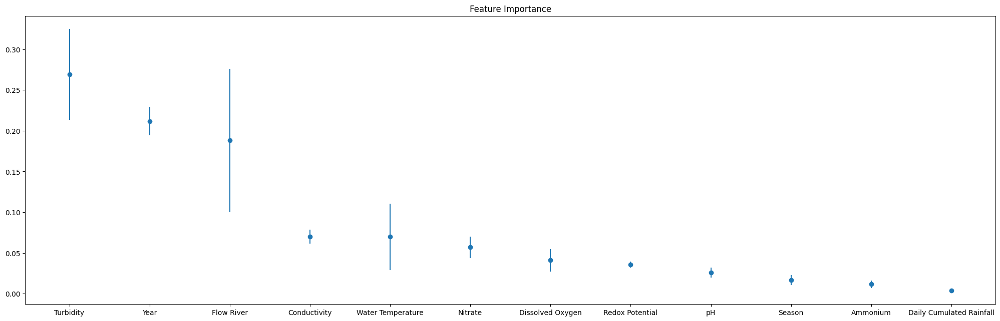

In [199]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = X_train.columns.difference(["DateTime"])
feature_importance["importance_mean"] = np.mean(
    [
        estimator.feature_importances_
        for estimator in rf_ensemble["estimator"]
    ],
    axis=0,
)
feature_importance["importance_std"] = np.std(
    [
        estimator.feature_importances_
        for estimator in rf_ensemble["estimator"]
    ],
    axis=0,
)

feature_importance = feature_importance.sort_values(
    by="importance_mean", ascending=False
)

# plot the importance of each feature with the std
plt.figure(figsize=(25, 7.5))
plt.errorbar(
    x=feature_importance["feature"],
    y=feature_importance["importance_mean"],
    yerr=feature_importance["importance_std"],
    fmt="o",
)
plt.title("Feature Importance")
plt.show()

### Predictions

In [200]:
# get predictions
mean_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.5)
        for estimator in rf_ensemble["estimator"]
    ]
)
lower_bound_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.05)
        for estimator in rf_ensemble["estimator"]
    ]
)
upper_bound_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.95)
        for estimator in rf_ensemble["estimator"]
    ]
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

In [201]:
mean_predictions = np.mean(mean_predictions, axis=0)
lower_bound_predictions = np.mean(lower_bound_predictions, axis=0)
upper_bound_predictions = np.mean(upper_bound_predictions, axis=0)

#### Try with best model

In [153]:
# %%script false --no-raise-error
# try with best single model
best_model = rf_ensemble["estimator"][4]

mean_predictions = best_model.predict(X_test_fit, quantiles=0.5)
lower_bound_predictions = best_model.predict(X_test_fit, quantiles=0.05)
upper_bound_predictions = best_model.predict(X_test_fit, quantiles=0.95)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(


#### Compute Measures

In [202]:
rmse = np.sqrt(mean_squared_error(y_test_fit, mean_predictions))
r2 = r2_score(y_test_fit, mean_predictions)

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")

RMSE: 3.51
R²: 0.15


### Plots

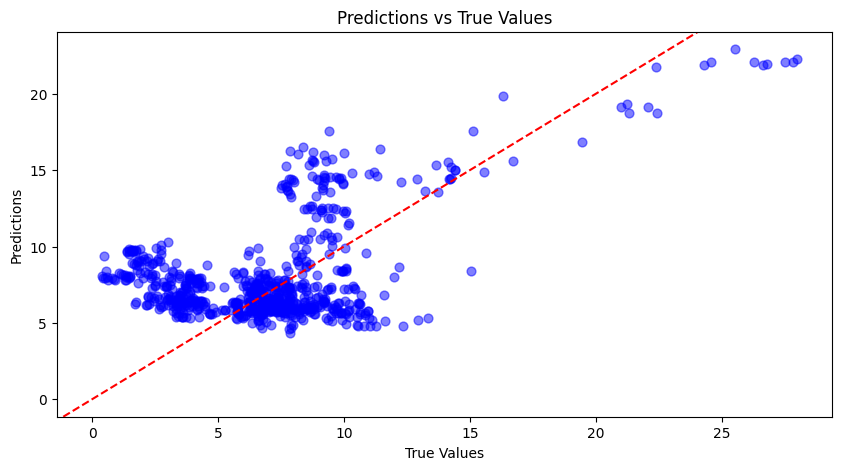

In [203]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit.values, mean_predictions, c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

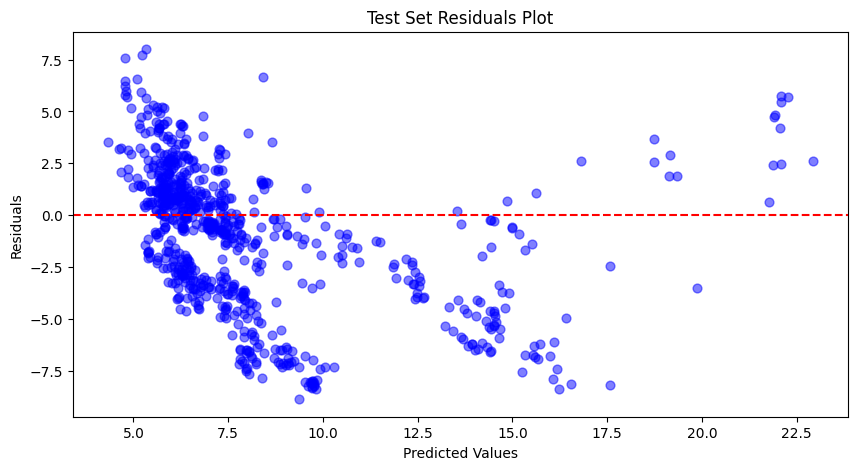

In [204]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - mean_predictions
plt.figure(figsize=(10, 5))
plt.scatter(mean_predictions, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

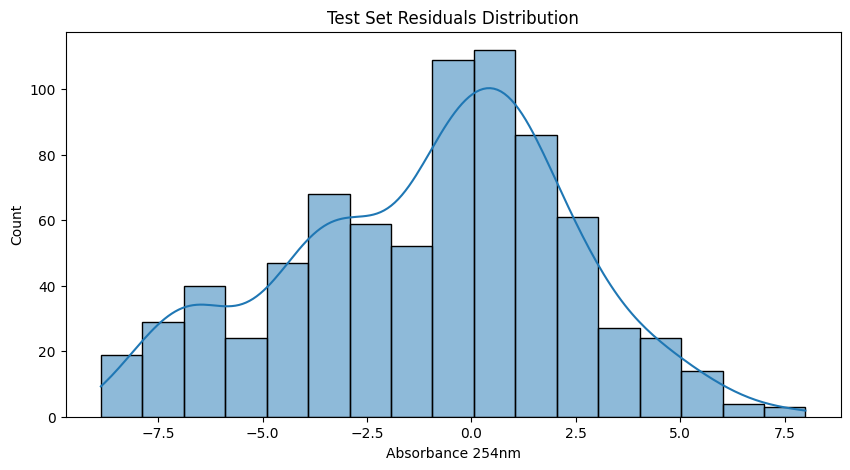

In [205]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [206]:
# get training residuals
train_predictions = np.array(
    [
        estimator.predict(X_train_fit, quantiles=0.5)
        for estimator in rf_ensemble["estimator"]
    ]
)
train_predictions = np.mean(train_predictions, axis=0)

train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.12/lib/python3.12/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

In [181]:
train_predictions = rf_model.predict(X_train_fit, quantiles=0.5)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

NotFittedError: This RandomForestQuantileRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

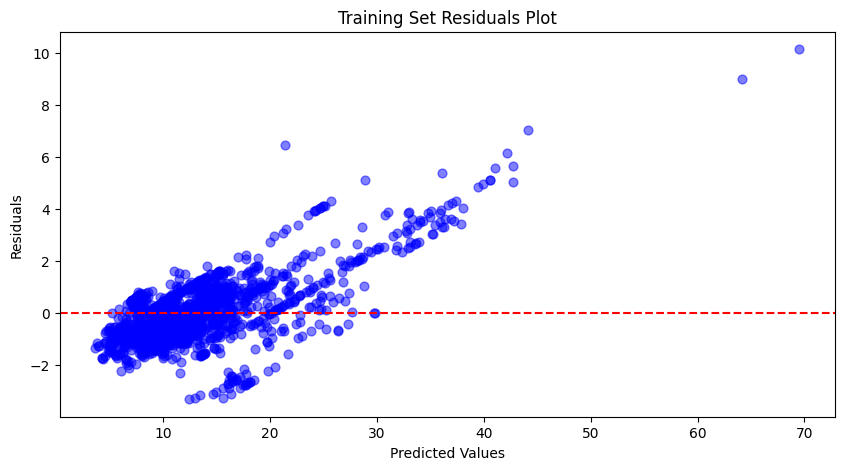

In [207]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

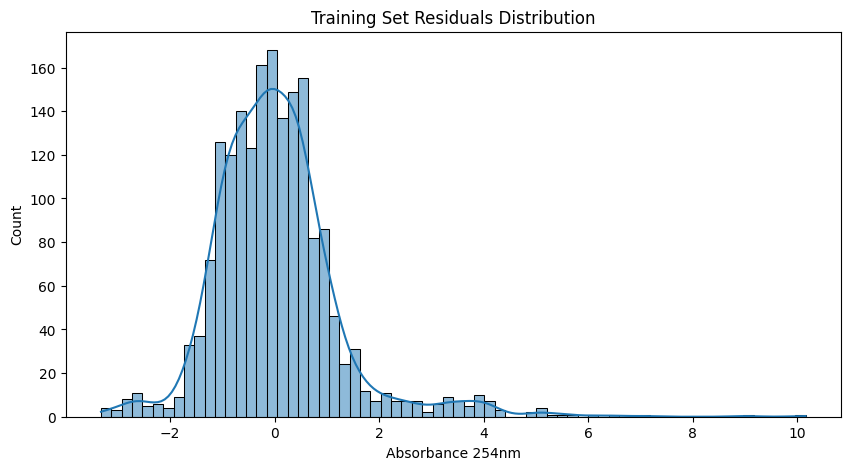

In [208]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

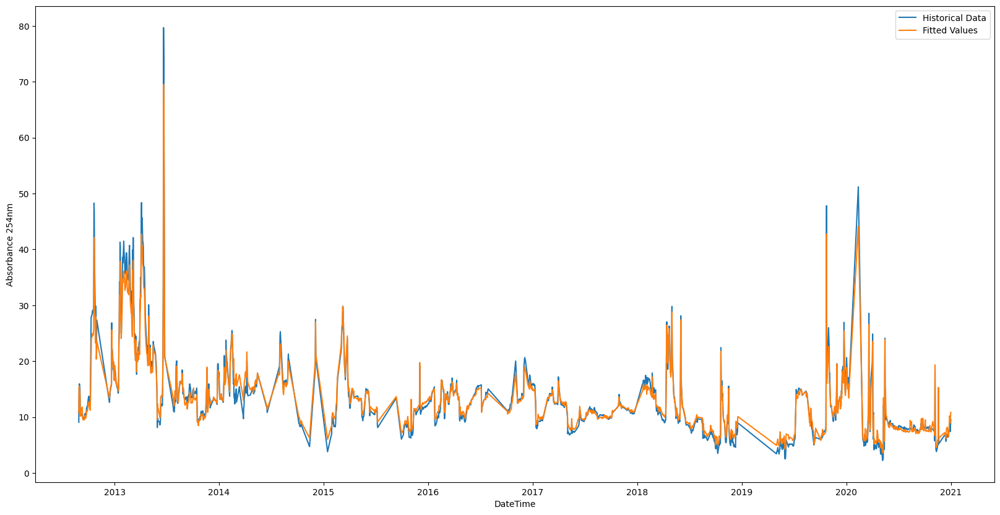

In [209]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"], y=train_predictions, label="Fitted Values"
)

plt.show()

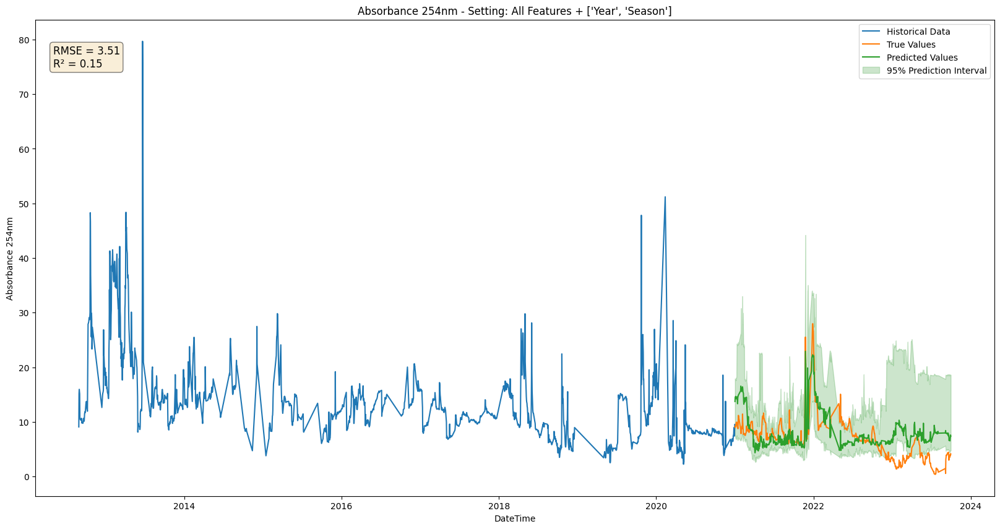

In [210]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"], y=mean_predictions, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    lower_bound_predictions,
    y2=upper_bound_predictions,
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [ ]:
rf_pred = mean_predictions
rf_lower_bound = lower_bound_predictions
rf_upper_bound = upper_bound_predictions
rf_rmse = rmse
rf_r2 = r2

# XGBoost

### Split Data

In [38]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Air Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [39]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [40]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [41]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Hyperparameter Tuning

In [42]:
def objective(trial):
    eta = trial.suggest_float("eta", 1e-5, 1, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 1, log=True)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 1, log=True)
    learning_rate = trial.suggest_float(
        "learning_rate", 1e-5, 1, log=True
    )
    n_estimators = trial.suggest_int("n_estimators", 1, 500)
    updater = trial.suggest_categorical(
        "updater", ["shotgun", "coord_descent"]
    )

    params = {
        "objective": "reg:squarederror",
        "booster": "gblinear",
        "eta": eta,
        "reg_lambda": reg_lambda,
        "reg_alpha": reg_alpha,
        "learning_rate": learning_rate,
        "n_estimators": n_estimators,
        "updater": updater,
    }

    res = xgb.cv(
        params=params,
        dtrain=xgb.DMatrix(
            X_train_fit, label=y_train_fit["Absorbance 254nm"]
        ),
        nfold=5,
        metrics="rmse",
        seed=42,
    )

    return res["test-rmse-mean"].iloc[-1]

In [43]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///XGBoost.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2024-04-04 11:24:12,024] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year']' instead of creating a new one.


  0%|          | 0/500 [00:00<?, ?it/s]

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate

[I 2024-04-04 11:24:12,350] Trial 500 finished with value: 4.1863665590844805 and parameters: {'eta': 0.16286678222000156, 'reg_lambda': 1.2470910862137432e-05, 'reg_alpha': 0.22997333606765796, 'learning_rate': 0.18024160050644364, 'n_estimators': 32, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,419] Trial 501 finished with value: 4.230205371281426 and parameters: {'eta': 0.2387505010867048, 'reg_lambda': 3.898708085433714e-06, 'reg_alpha': 0.00361640788437444, 'learning_rate': 0.2578950927544987, 'n_estimators': 1, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,486] Trial 502 finished with value: 4.227266652058572 and parameters: {'eta': 0.12704299721557522, 'reg_lambda': 6.190161235885781e-06, 'reg_alpha': 0.1437879690057899, 'learning_rate': 0.343304040249948, 'n_estimators': 22, 'updater': 'coord_descent'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,548] T

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate

[I 2024-04-04 11:24:12,660] Trial 504 finished with value: 4.196282207140429 and parameters: {'eta': 0.3020956525362362, 'reg_lambda': 3.5216492868390404e-05, 'reg_alpha': 0.0890874959438851, 'learning_rate': 0.12831561388710067, 'n_estimators': 13, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,721] Trial 505 finished with value: 4.171278099775812 and parameters: {'eta': 0.1935457371367843, 'reg_lambda': 1.706288056878761e-05, 'reg_alpha': 0.16441756551846964, 'learning_rate': 0.20917440879692933, 'n_estimators': 201, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,781] Trial 506 finished with value: 4.176390513301186 and parameters: {'eta': 0.18556623011607207, 'reg_lambda': 1.702653519614051e-05, 'reg_alpha': 0.20375240430472713, 'learning_rate': 0.15968711059137755, 'n_estimators': 205, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:12,842] Tri

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[I 2024-04-04 11:24:12,908] Trial 508 finished with value: 4.192515990670897 and parameters: {'eta': 0.1415857366807821, 'reg_lambda': 2.466374818639064e-05, 'reg_alpha': 0.1185325053189507, 'learning_rate': 0.12250448751724176, 'n_estimators': 197, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,033] Trial 509 finished with value: 4.176703142429463 and parameters: {'eta': 0.19349201280357123, 'reg_lambda': 1.6411435184185755e-05, 'reg_alpha': 0.20464303102743825, 'learning_rate': 0.18687600654639763, 'n_estimators': 209, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,099] Trial 510 finished with value: 4.1750062228628 and parameters: {'eta': 0.11127829009764015, 'reg_lambda': 8.698666630983639e-06, 'reg_alpha': 0.06397127550120167, 'learning_rate': 0.16382741711568152, 'n_estimators': 216, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[I 2024-04-04 11:24:13,167] Trial 511 finished with value: 4.2533929728160444 and parameters: {'eta': 0.05986355818180666, 'reg_lambda': 7.083500295899438e-06, 'reg_alpha': 0.03826753289349482, 'learning_rate': 0.0838889100803307, 'n_estimators': 210, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,275] Trial 512 finished with value: 4.222301349563673 and parameters: {'eta': 0.10347713757758223, 'reg_lambda': 8.445761448043634e-06, 'reg_alpha': 0.0546364731878278, 'learning_rate': 0.10090499055479671, 'n_estimators': 180, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,335] Trial 513 finished with value: 4.186167824440636 and parameters: {'eta': 0.08851775500081278, 'reg_lambda': 4.803708691113666e-06, 'reg_alpha': 0.060871632077906426, 'learning_rate': 0.1344024679656031, 'n_estimators': 214, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate

[I 2024-04-04 11:24:13,400] Trial 514 finished with value: 4.1788703140792 and parameters: {'eta': 0.11720625684697641, 'reg_lambda': 7.984807805982349e-07, 'reg_alpha': 0.08060720297479781, 'learning_rate': 0.15599432721418452, 'n_estimators': 220, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,466] Trial 515 finished with value: 4.1801740777623415 and parameters: {'eta': 0.13508087219327833, 'reg_lambda': 1.0687329623543048e-05, 'reg_alpha': 0.08149331422663268, 'learning_rate': 0.1643209449965676, 'n_estimators': 231, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,525] Trial 516 finished with value: 4.201589283918335 and parameters: {'eta': 0.1625475132915413, 'reg_lambda': 5.946406457675992e-06, 'reg_alpha': 0.03206491476272809, 'learning_rate': 0.1162132648452695, 'n_estimators': 200, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[I 2024-04-04 11:24:13,599] Tri

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [11:24:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[I 2024-04-04 11:24:13,667] Trial 518 finished with value: 4.180859930829573 and parameters: {'eta': 0.009665165970503473, 'reg_lambda': 3.5628836217685e-06, 'reg_alpha': 0.12776153093434142, 'learning_rate': 0.14702509205405742, 'n_estimators': 191, 'updater': 'shotgun'}. Best is trial 258 with value: 4.161639724460182.
[W 2024-04-04 11:24:13,719] Trial 519 failed with parameters: {'eta': 0.09303154668860028, 'reg_lambda': 1.1555333025537465e-05, 'reg_alpha': 0.044922759642822836, 'learning_rate': 0.20621387733258775} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_4573/1686588342.py", line 7, in objective
    n_estimators = trial.sugge

KeyboardInterrupt: 

In [45]:
study.best_params

{'eta': 0.1273251370464068,
 'reg_lambda': 7.781567851853081e-06,
 'reg_alpha': 0.17948188210499239,
 'learning_rate': 0.2092380865744651,
 'n_estimators': 41,
 'updater': 'shotgun'}

In [46]:
params = study.best_params
params["objective"] = "reg:squarederror"
params["booster"] = "gblinear"

In [47]:
booster = xgb.XGBRegressor(random_state=42, **params)

booster.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

XGBRegressor(base_score=None, booster='gblinear', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.1273251370464068, eval_metric=None,
             feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.2092380865744651, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=41, n_jobs=None,
             num_parallel_tree=None, ...)

### Feature Importance

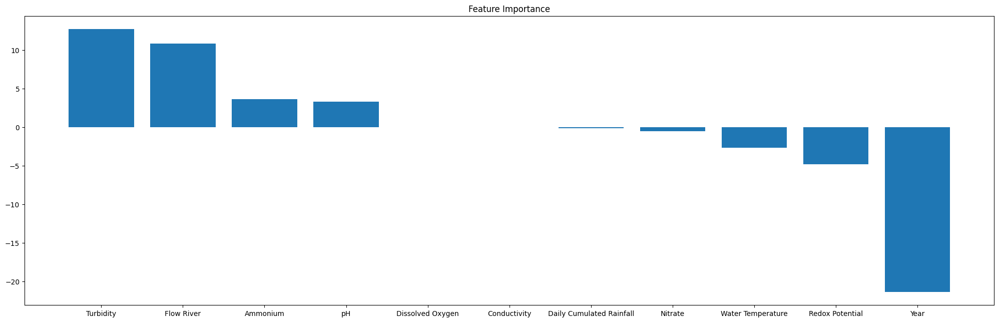

In [202]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = booster.feature_names_in_
feature_importance["importance"] = booster.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)
plt.title("Feature Importance")
plt.show()

### Predictions

In [203]:
mapie_cqr = MapieRegressor(booster, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(cv='prefit',
               estimator=XGBRegressor(base_score=None, booster='gblinear',
                                      callbacks=None, colsample_bylevel=None,
                                      colsample_bynode=None,
                                      colsample_bytree=None, device=None,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eta=0.1273251370464068, eval_metric=None,
                                      feature_types=None, gamma=None,
                                      grow_policy=None, importance_type=None,
                                      interaction_constraints=None,
                                      learning_rate=0.2092380865744651,
                                      max_bin=None, max_cat_threshold=None,
                                      max_cat_to_onehot=None,
                                      max_delta_step=None, max_depth=None,
                                      max_leaves=None, min_child_weight=None,
                                      missing=nan, monotone_constraints=None,
                                      multi_strategy=None, n_estimators=41,
                                      n_jobs=None, num_parallel_tree=None, ...),
               method='base', random_state=42)

In [204]:
alpha = 0.1

# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

print(f"Coverage: {coverage_cqr}")

Coverage: 1.0


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


#### Compute Measures

In [205]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")

RMSE: 2.38
R²: 0.55


### Plots

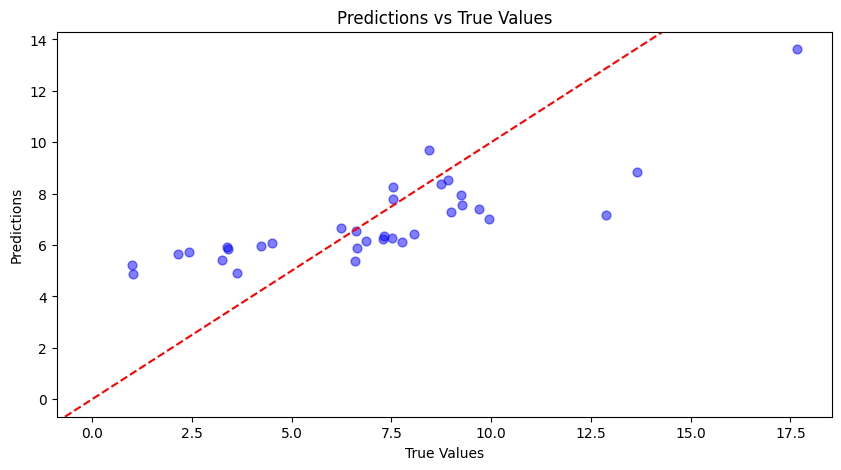

In [52]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

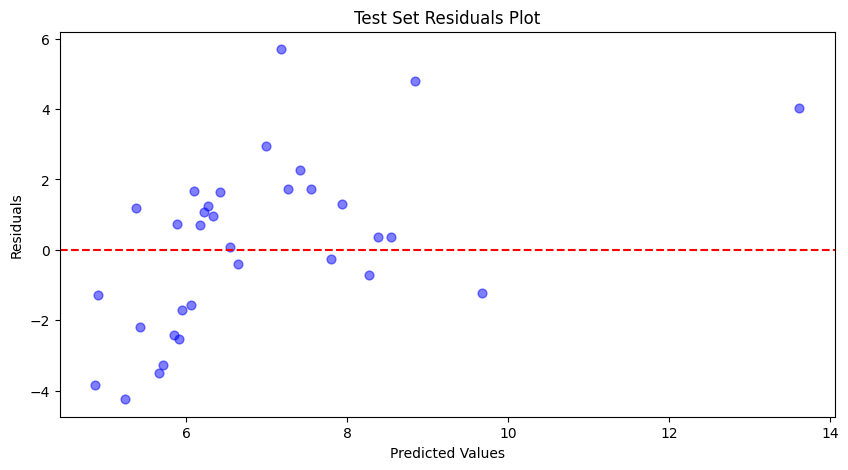

In [53]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

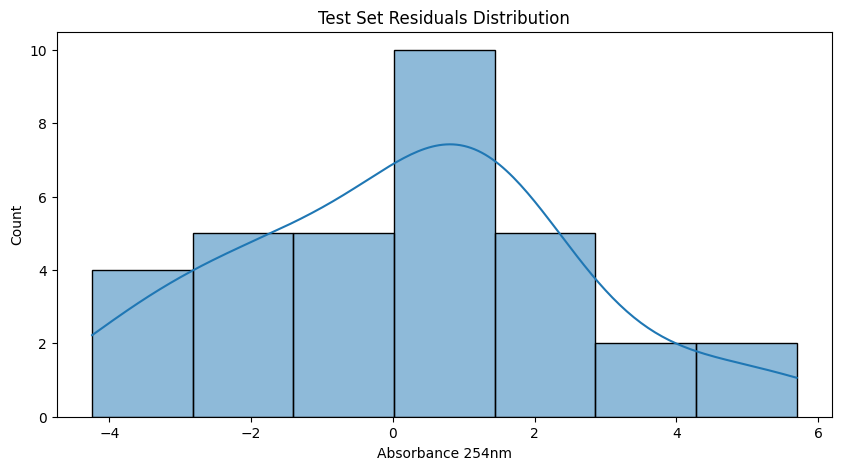

In [54]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [55]:
# get training residuals
train_predictions = booster.predict(X_train_fit)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

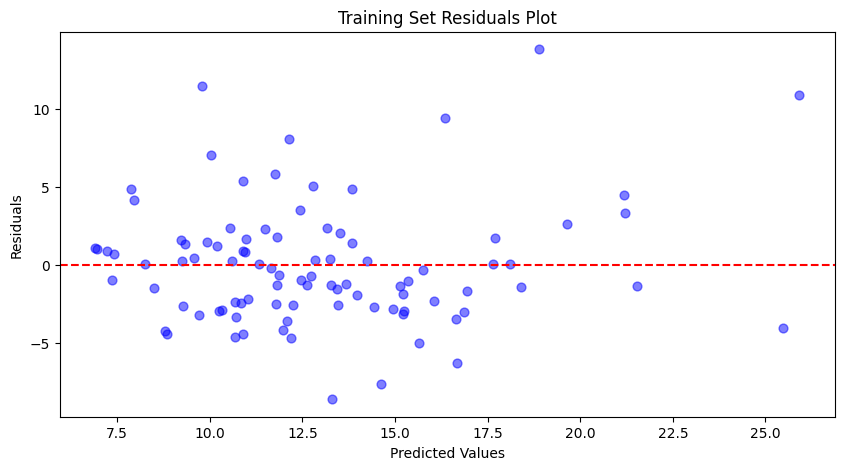

In [56]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

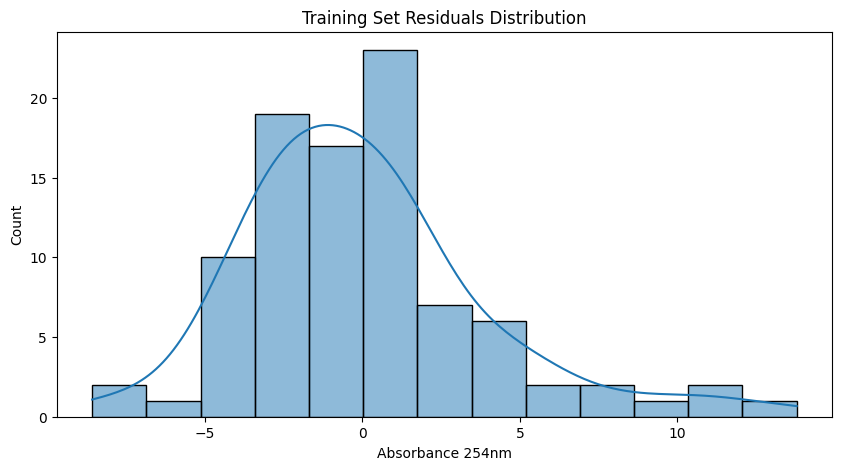

In [57]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

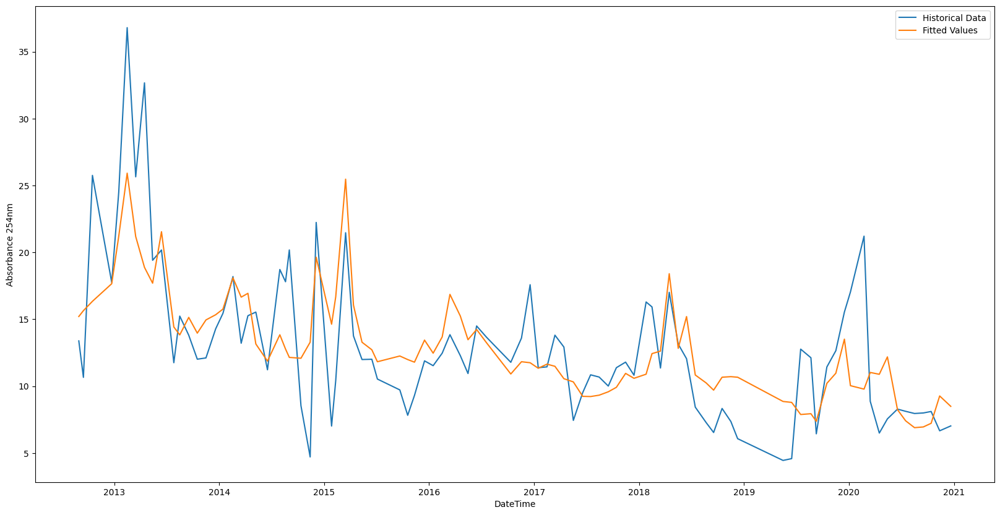

In [58]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"], y=train_predictions, label="Fitted Values"
)

plt.show()

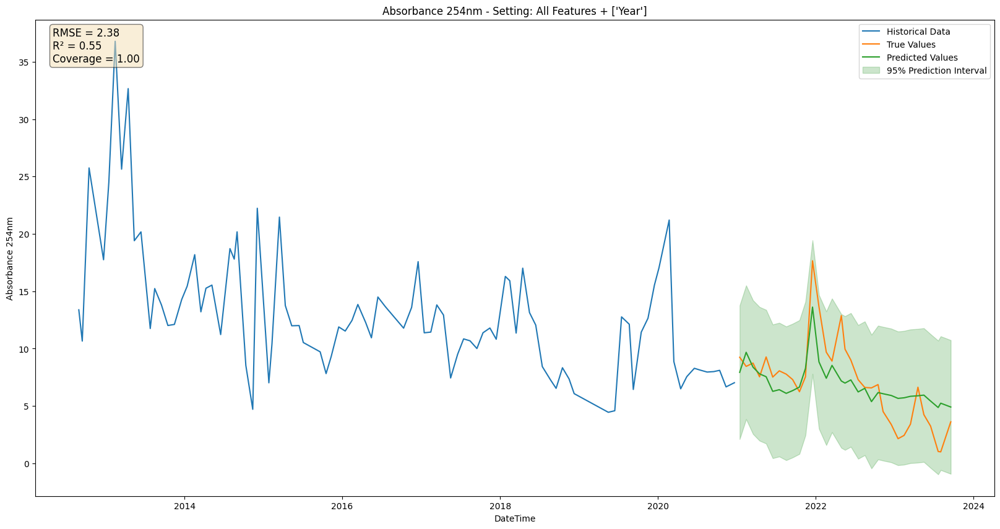

In [59]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(x=y_test["DateTime"], y=y_med, label="Predicted Values")
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    y_lower,
    y2=y_upper,
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [60]:
boost_pred = y_med
boost_lower_bound = y_lower
boost_upper_bound = y_upper
boost_rmse = rmse
boost_r2 = r2

# LightGBM (Random Forest with Linear Regressors on leaves)

### Split Data

In [206]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [207]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [208]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [209]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Learning and Validation Curves

In [210]:
def learning_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    train_sizes=np.linspace(0.3, 1.0, 5),
):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator,
        X,
        y,
        train_sizes=train_sizes,
        cv=cv,
        scoring="neg_mean_squared_error",
    )

    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    validation_scores_mean = np.sqrt(
        -np.mean(validation_scores, axis=1)
    )
    validation_scores_std = np.sqrt(np.std(validation_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.plot(
        train_sizes,
        train_scores_mean,
        "o-",
        color="r",
        label="Training error",
    )
    plt.plot(
        train_sizes,
        validation_scores_mean,
        "o-",
        color="g",
        label="Validation error",
    )
    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        validation_scores_mean - validation_scores_std,
        validation_scores_mean + validation_scores_std,
        alpha=0.1,
        color="g",
    )

    plt.rcParams["font.size"] = 10
    plt.ylabel("RMSE", fontsize=14)
    plt.xlabel("Training set size", fontsize=14)
    title = title
    plt.title(title, fontsize=18, y=1.03)
    plt.legend()
    plt.show()

In [211]:
def validation_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    param_name=None,
    param_range=None,
    fit_params=None,
):
    train_scores, test_scores = validation_curve(
        estimator,
        X,
        y,
        param_name=param_name,
        param_range=param_range,
        fit_params=fit_params,
        cv=cv,
        scoring="neg_mean_squared_error",  #'roc_auc'
        n_jobs=4,
    )
    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    test_scores_mean = np.sqrt(-np.mean(test_scores, axis=1))
    test_scores_std = np.sqrt(np.std(test_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.title(title, fontsize=20)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("Score", fontsize=14)
    lw = 2
    plt.plot(
        param_range,
        train_scores_mean,
        label="Training score",
        color="darkorange",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.2,
        color="darkorange",
        lw=lw,
    )
    plt.plot(
        param_range,
        test_scores_mean,
        label="Cross-validation score",
        color="navy",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.2,
        color="navy",
        lw=lw,
    )
    plt.rcParams["font.size"] = 10
    plt.legend(loc="best")
    # plt.ylim(4, 8)
    plt.grid(visible=True)
    plt.show()

    # print param value with lowest test score
    print(
        f"{param_name} with lowest score:",
        param_range[np.argmin(test_scores_mean)],
    )

In [299]:
params_lgb = {
    "objective": "regression",
    "linear_tree": True,
    "random_state": 42,
}

In [300]:
model = LGBMRegressor(**params_lgb)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 22, number of used features: 0
[LightGBM] [Info] Start training from score 12.915934
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

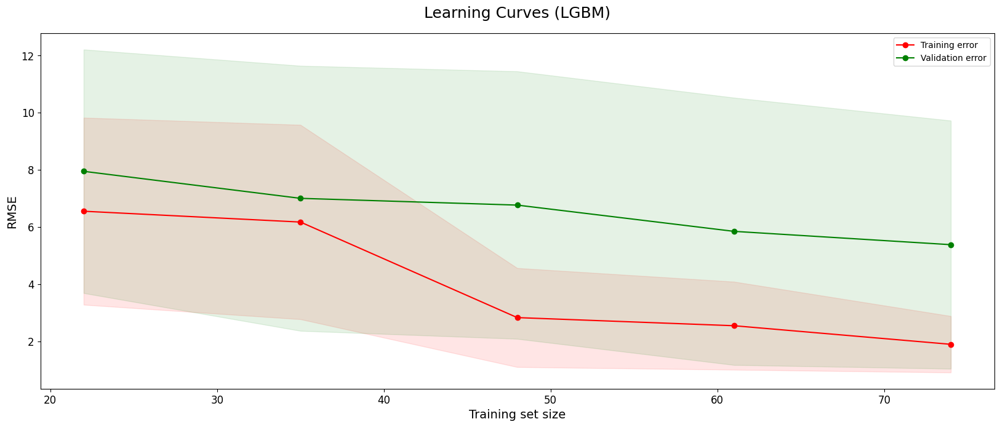

In [301]:
title = "Learning Curves (LGBM)"
learning_curves(
    model, title, X_train_fit, y_train_fit["Absorbance 254nm"], cv=5
)

In [23]:
param_name = "n_estimators"
param_range = np.arange(1, 100, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000296 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001269 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001279 seconds.
You can set `force_col_wise=true` to remove the overhead.

[LightG

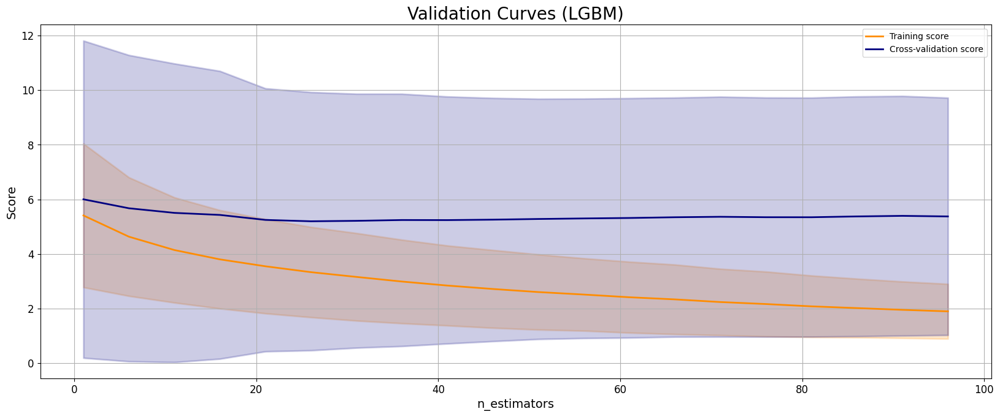

n_estimators with lowest score: 26


In [24]:
title = "Validation Curves (LGBM)"
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [25]:
param_name = "learning_rate"
param_range = np.logspace(-3, -1, 10)

In [26]:
np.logspace(-3, -1, 10)

array([0.001     , 0.0016681 , 0.00278256, 0.00464159, 0.00774264,
       0.0129155 , 0.02154435, 0.03593814, 0.05994843, 0.1       ])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

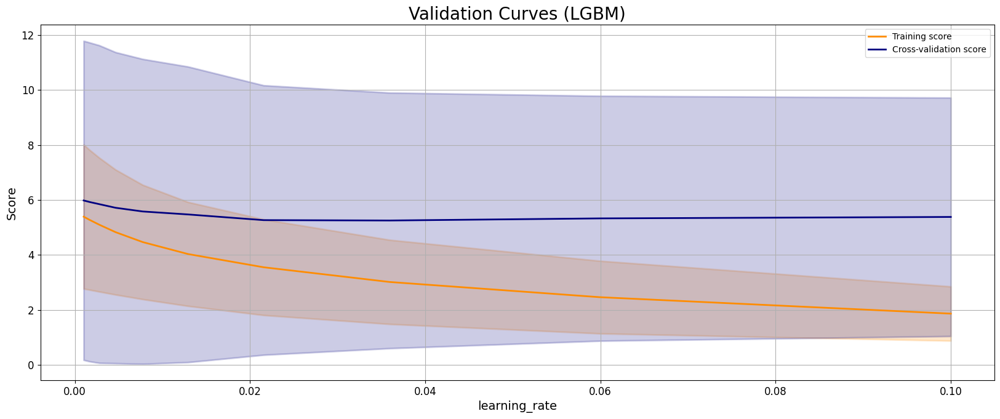

learning_rate with lowest score: 0.03593813663804626


In [27]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [28]:
param_name = "num_leaves"
param_range = np.arange(2, 50, 2)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

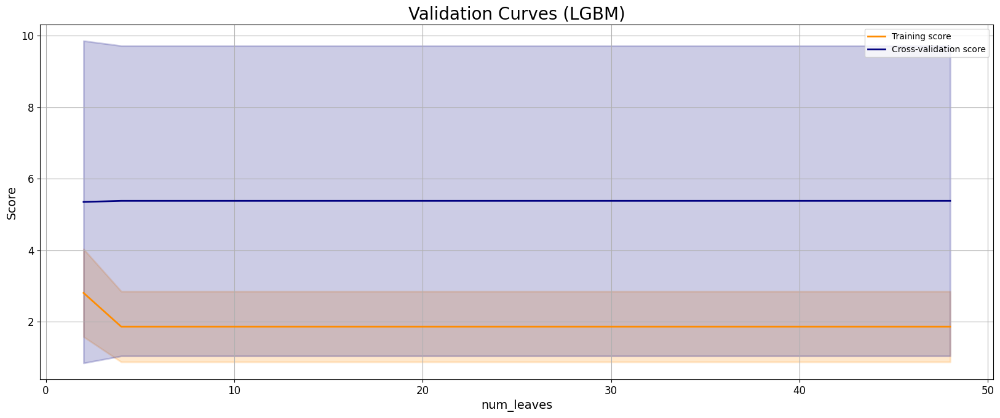

num_leaves with lowest score: 2


In [29]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [30]:
param_name = "lambda_l1"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Warning] lambda_l1 is set=2.782559402207126e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782559402207126e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.782559402207126e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782559402207126e-05
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12

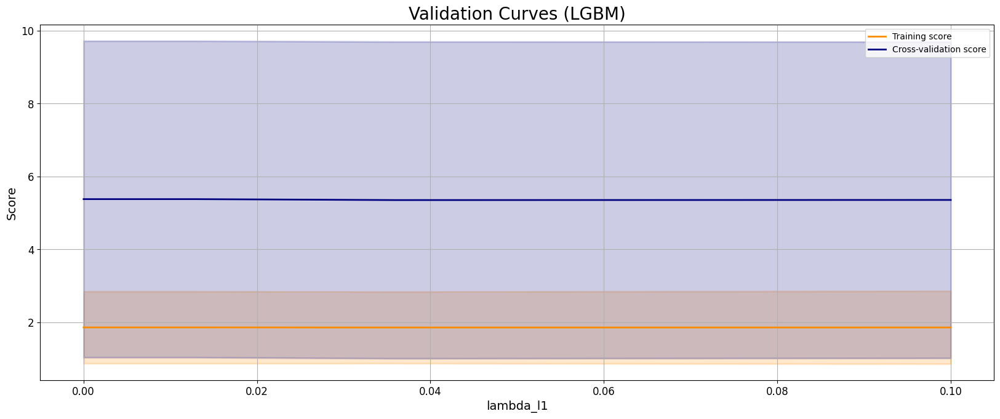

lambda_l1 with lowest score: 0.03593813663804626


In [31]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [32]:
param_name = "lambda_l2"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=2.782559402207126e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.782559402207126e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=2.782559402207126e-05, reg_lambd

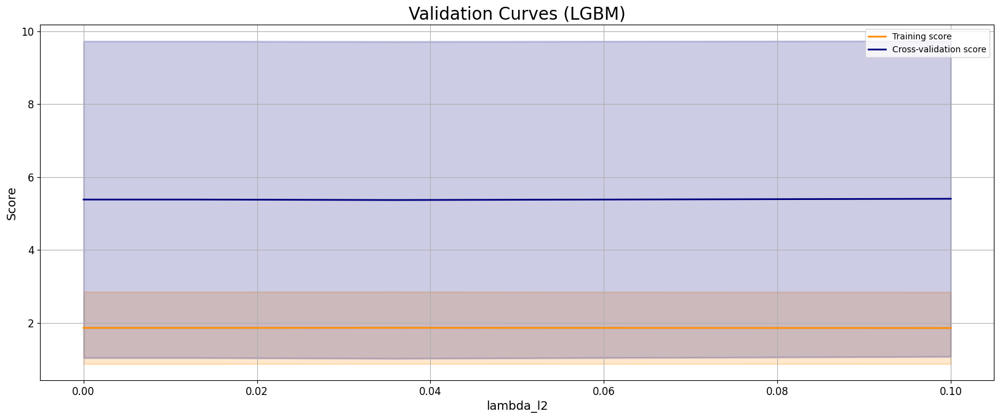

lambda_l2 with lowest score: 0.03593813663804626


In [33]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [34]:
param_name = "max_depth"
param_range = np.arange(2, 20, 1)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 12
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000411 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 296
[Light

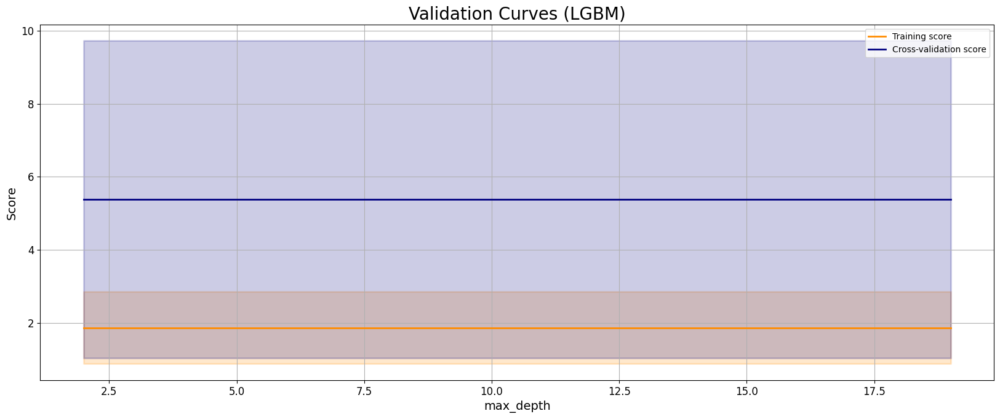

max_depth with lowest score: 2


In [35]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [36]:
param_name = "max_bin"
param_range = np.arange(2, 255, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 11
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 84
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 

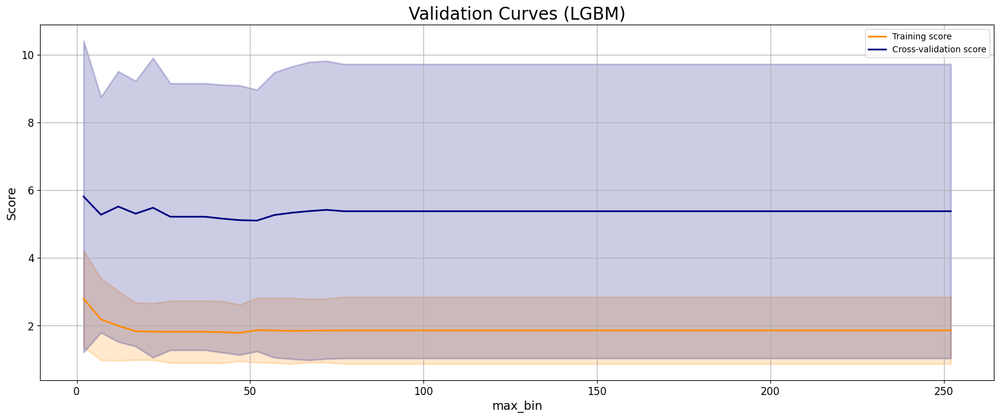

max_bin with lowest score: 52


In [37]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

#### Hyperparameter Tuning

In [212]:
def fit_and_validate_lgbm_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = LGBMRegressor(
        objective="regression",
        random_state=42,
        linear_tree=True,
    )

    if params is not None:
        model.set_params(**params)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [213]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "n_estimators": trial.suggest_int(
            "n_estimators", 1, 20, step=1
        ),
        "learning_rate": trial.suggest_float(
            "learning_rate", 1e-3, 1, log=True
        ),
        "max_depth": trial.suggest_int("max_depth", 2, 16, step=1),
        "num_leaves": trial.suggest_int("num_leaves", 2, 20, step=1),
        "min_data_in_leaf": trial.suggest_int(
            "min_data_in_leaf", 2, 50, step=1
        ),
        "lambda_l1": trial.suggest_float(
            "lambda_l1", 1e-3, 10, log=True
        ),
        "lambda_l2": trial.suggest_float(
            "lambda_l2", 1e-3, 10, log=True
        ),
        "min_split_gain": trial.suggest_float(
            "min_split_gain", 0, 15, step=0.5
        ),
        "subsample": trial.suggest_float("subsample", 0.1, 1),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 1e-3, 1, log=True
        ),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 1e-3, 1, log=True
        ),
        "min_child_samples": trial.suggest_int(
            "min_child_samples", 20, 1000, log=True
        ),
        "max_bin": trial.suggest_int("max_bin", 10, 120, step=10),
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_lgbm_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [214]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///LGBM.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2024-04-04 11:46:30,566] A new study created in RDB with name: Hyperparameter Tuning - All Features + ['Year']


  0%|          | 0/500 [00:00<?, ?it/s]

[LightGBM] [Warning] lambda_l1 is set=0.2369785987484064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2369785987484064
[LightGBM] [Warning] lambda_l2 is set=0.01570035991930252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01570035991930252
[LightGBM] [Warning] bagging_fraction is set=0.19910704153322697, subsample=0.5852014648077379 will be ignored. Current value: bagging_fraction=0.19910704153322697
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=859 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] feature_fraction is set=0.0031336770407197293, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0031336770407197293
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.2369785987484064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2369785987484064
[LightGBM] [Warning] lambda_l2 is set=0.01570035991930252, reg_lambda=0

KeyboardInterrupt: 

In [215]:
study.best_params

{'n_estimators': 17,
 'learning_rate': 0.5363016086361552,
 'max_depth': 11,
 'num_leaves': 4,
 'min_data_in_leaf': 32,
 'lambda_l1': 0.3835512970455462,
 'lambda_l2': 0.6396662214087452,
 'min_split_gain': 8.5,
 'subsample': 0.6323814800462711,
 'bagging_fraction': 0.012160291014976626,
 'feature_fraction': 0.004669146878266245,
 'min_child_samples': 119,
 'max_bin': 60}

In [237]:
params = study.best_params
params = {
    "n_estimators": 18,
    "learning_rate": 0.5229033542124926,
    "max_depth": 3,
    "num_leaves": 18,
    "min_data_in_leaf": 34,
    "lambda_l1": 5.895249677791268,
    "lambda_l2": 3.63983322199337,
    "min_split_gain": 7.5,
    "subsample": 0.7775889010545852,
    "bagging_fraction": 0.0026325795079843632,
    "feature_fraction": 0.006046266743821806,
    "min_child_samples": 137,
    "max_bin": 20,
}

# params['n_estimators'] = 15
# params['min_data_in_leaf'] = 30
# params['max_bin'] = 30
# params['learning_rate'] = 0.6
# params['lambda_l2'] = 1

In [238]:
%%script false --no-raise-error
# best params for the daily time series

params = {
    'n_estimators': 20,
    'learning_rate': 0.2355,
    'max_depth': 10,
    'num_leaves': 20,
    'min_data_in_leaf': 23,
    'lambda_l1': 0.12046319959934189,
    'lambda_l2': 0.0020380665600964157,
    'min_split_gain': 2.0,
    'subsample': 0.714993442284089,
    'bagging_fraction': 0.3723469453323971,
    'feature_fraction': 0.7631924074906202,
    'min_child_samples': 870,
    'max_bin': 365
}

#### Train model with mapie

In [239]:
alpha = 0.1
estimator = LGBMRegressor(
    objective="regression", random_state=42, linear_tree=True, **params
)

estimator.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=5.895249677791268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.895249677791268
[LightGBM] [Warning] lambda_l2 is set=3.63983322199337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.63983322199337
[LightGBM] [Warning] bagging_fraction is set=0.0026325795079843632, subsample=0.7775889010545852 will be ignored. Current value: bagging_fraction=0.0026325795079843632
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=137 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.006046266743821806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.006046266743821806
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=5.895249677791268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.895249677791268
[LightGBM] [Warning] lambda_l2 is set=3.63983322199337, reg_lambda=0.0 will be 

LGBMRegressor(bagging_fraction=0.0026325795079843632,
              feature_fraction=0.006046266743821806,
              lambda_l1=5.895249677791268, lambda_l2=3.63983322199337,
              learning_rate=0.5229033542124926, linear_tree=True, max_bin=20,
              max_depth=3, min_child_samples=137, min_data_in_leaf=34,
              min_split_gain=7.5, n_estimators=18, num_leaves=18,
              objective='regression', random_state=42,
              subsample=0.7775889010545852)

In [240]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(estimator, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=5.895249677791268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.895249677791268
[LightGBM] [Warning] lambda_l2 is set=3.63983322199337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.63983322199337
[LightGBM] [Warning] bagging_fraction is set=0.0026325795079843632, subsample=0.7775889010545852 will be ignored. Current value: bagging_fraction=0.0026325795079843632
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=137 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.006046266743821806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.006046266743821806


MapieRegressor(cv='prefit',
               estimator=LGBMRegressor(bagging_fraction=0.0026325795079843632,
                                       feature_fraction=0.006046266743821806,
                                       lambda_l1=5.895249677791268,
                                       lambda_l2=3.63983322199337,
                                       learning_rate=0.5229033542124926,
                                       linear_tree=True, max_bin=20,
                                       max_depth=3, min_child_samples=137,
                                       min_data_in_leaf=34, min_split_gain=7.5,
                                       n_estimators=18, num_leaves=18,
                                       objective='regression', random_state=42,
                                       subsample=0.7775889010545852),
               method='base', random_state=42)

### Feature Importance

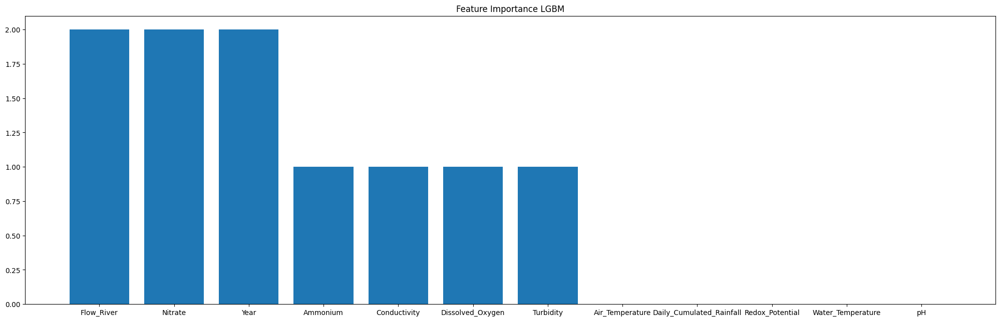

In [241]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = estimator.feature_name_
feature_importance["importance"] = estimator.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)
plt.title("Feature Importance LGBM")
plt.show()

### Predictions

In [242]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

[LightGBM] [Warning] lambda_l1 is set=5.895249677791268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.895249677791268
[LightGBM] [Warning] lambda_l2 is set=3.63983322199337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.63983322199337
[LightGBM] [Warning] bagging_fraction is set=0.0026325795079843632, subsample=0.7775889010545852 will be ignored. Current value: bagging_fraction=0.0026325795079843632
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=137 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.006046266743821806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.006046266743821806


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [243]:
print("Coverage:", coverage_cqr)

Coverage: 0.9393939393939394


#### Compute Measures

In [244]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.4f}")
print(f"R\u00b2: {r2:.4f}")

RMSE: 3.1495
R²: 0.2138


### Plots

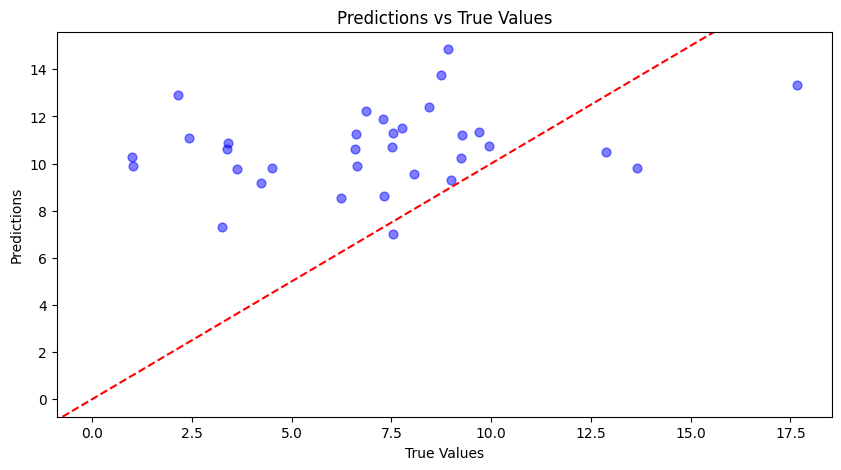

In [201]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

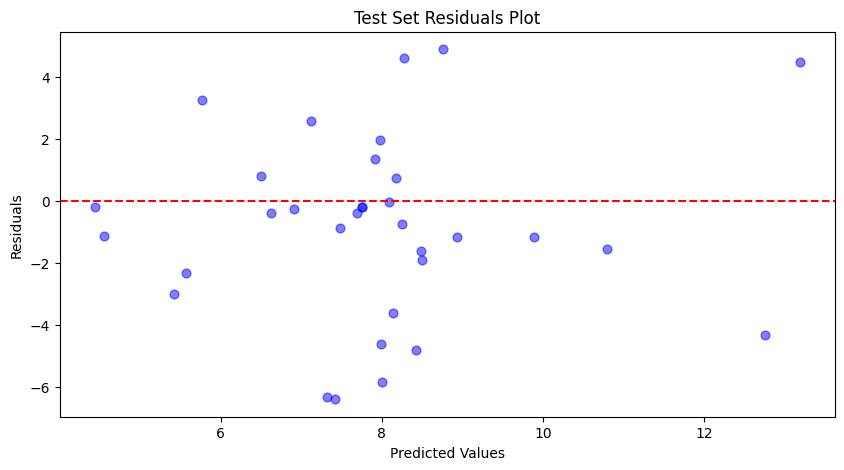

In [93]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

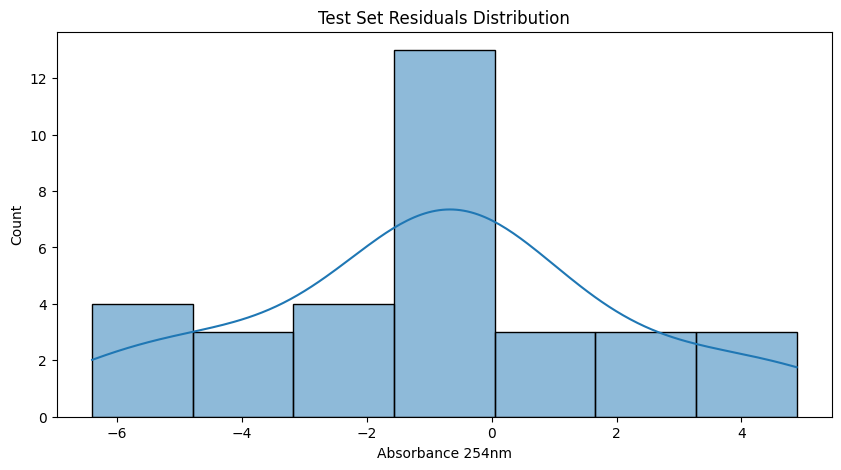

In [94]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [95]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

[LightGBM] [Warning] lambda_l1 is set=5.895249677791268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.895249677791268
[LightGBM] [Warning] lambda_l2 is set=3.63983322199337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.63983322199337
[LightGBM] [Warning] bagging_fraction is set=0.0026325795079843632, subsample=0.7775889010545852 will be ignored. Current value: bagging_fraction=0.0026325795079843632
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=137 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.006046266743821806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.006046266743821806


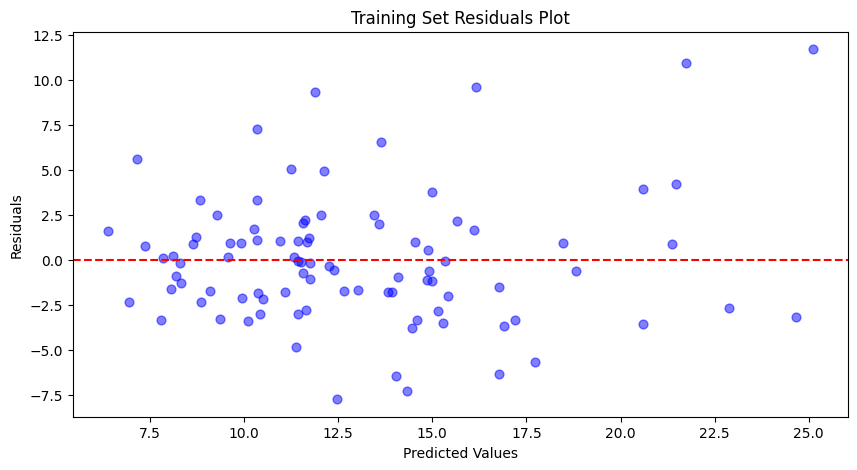

In [96]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

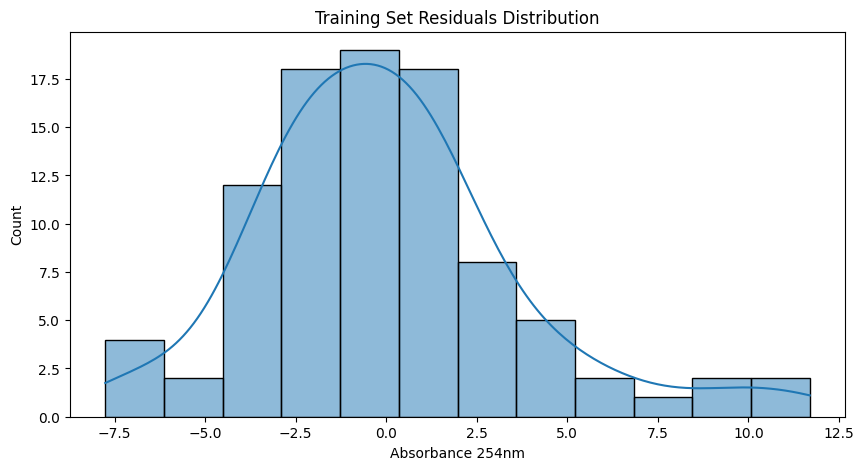

In [97]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

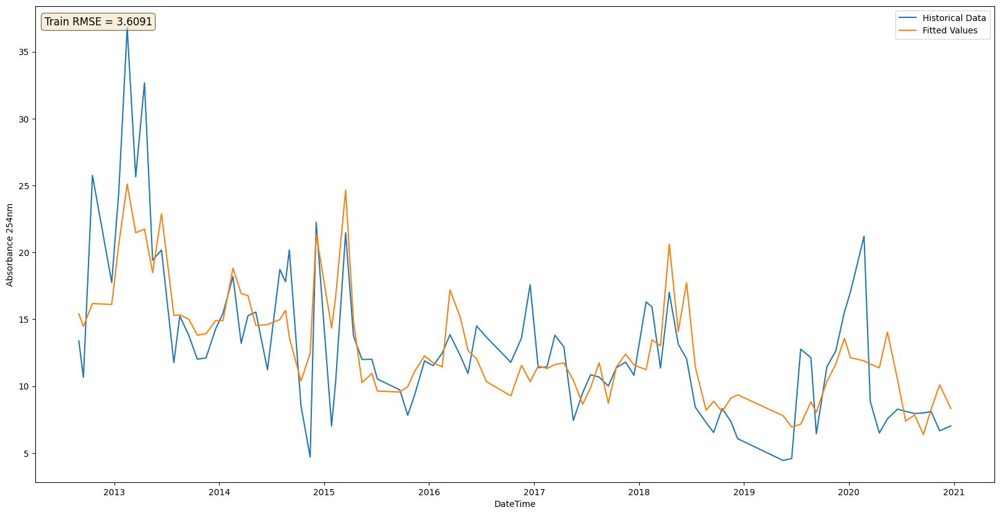

In [98]:
training_error = mean_squared_error(
    y_train_fit["Absorbance 254nm"], train_predictions, squared=False
)

# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

# add training error to the plot
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = f"Train RMSE = {training_error:.4f}"

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    37,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.show()

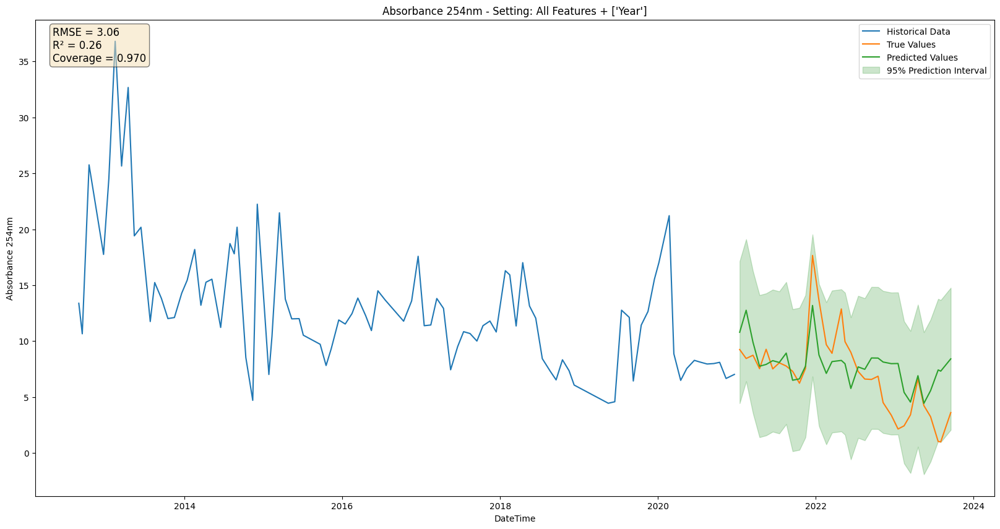

In [99]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test_fit["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test_fit["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test_fit["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [100]:
lgbm_pred = y_med
lgbm_lower_bound = y_lower
lgbm_upper_bound = y_upper
lgbm_rmse = rmse
lgbm_r2 = r2

# Neural Network

## Split Data

In [112]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm", "Air Temperature"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [113]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [114]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [115]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

## Train the model

### Hyperparameter Tuning

In [116]:
def fit_and_validate_nn_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = MLPRegressor(
        random_state=42,
        hidden_layer_sizes=tuple(params["layers"]),
        max_iter=1000,
    )

    param = params.copy()
    param.pop("layers")
    model.set_params(**param)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [117]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "layers": [
            trial.suggest_int(f"n_units_{i}", 10, 100, step=5)
            for i in range(trial.suggest_int("n_layers", 2, 2))
        ],
        "activation": trial.suggest_categorical(
            "activation", ["identity", "logistic", "tanh", "relu"]
        ),
        "solver": trial.suggest_categorical("solver", ["sgd", "adam"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1),
        "learning_rate": trial.suggest_categorical(
            "learning_rate", ["constant", "invscaling", "adaptive"]
        ),
        "power_t": trial.suggest_float("power_t", 0.1, 1),
        "beta_1": trial.suggest_float("beta_1", 0.1, 1),
        "beta_2": trial.suggest_float("beta_2", 0.1, 1),
        "epsilon": trial.suggest_float("epsilon", 1e-8, 1),
        "early_stopping": True,
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_nn_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [118]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///NeuralNetwork.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=100, show_progress_bar=True)

[I 2024-04-04 11:29:36,371] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year']' instead of creating a new one.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2024-04-04 11:29:36,805] Trial 255 finished with value: 4.396628936611126 and parameters: {'n_layers': 2, 'n_units_0': 90, 'n_units_1': 70, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9991043648175351, 'learning_rate': 'constant', 'power_t': 0.35394386833417146, 'beta_1': 0.20062206095419194, 'beta_2': 0.927172237959781, 'epsilon': 0.3745858313516836}. Best is trial 243 with value: 4.038689253792624.
[I 2024-04-04 11:29:37,165] Trial 256 finished with value: 4.0387042106819875 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 75, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9651970847510923, 'learning_rate': 'constant', 'power_t': 0.28033345633800966, 'beta_1': 0.16460863143377655, 'beta_2': 0.895312425710779, 'epsilon': 0.6018666260852744}. Best is trial 243 with value: 4.038689253792624.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


[I 2024-04-04 11:29:37,953] Trial 257 finished with value: 4.5090926125899085 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 95, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9739648360149965, 'learning_rate': 'invscaling', 'power_t': 0.3338564529876496, 'beta_1': 0.16498265864102735, 'beta_2': 0.903609951715933, 'epsilon': 0.6091814124536543}. Best is trial 243 with value: 4.038689253792624.
[I 2024-04-04 11:29:38,291] Trial 258 finished with value: 4.2807628648999225 and parameters: {'n_layers': 2, 'n_units_0': 80, 'n_units_1': 80, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9645423432149475, 'learning_rate': 'constant', 'power_t': 0.2725074873855103, 'beta_1': 0.17241460078171164, 'beta_2': 0.8896289758741709, 'epsilon': 0.5864516567644988}. Best is trial 243 with value: 4.038689253792624.
[I 2024-04-04 11:29:38,889] Trial 259 finished with value: 5.7512901244323 and parameters: {'n_layers': 2, 'n_units_0': 90, 'n_units_1': 75, 'activation': 'logisti

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


[I 2024-04-04 11:29:51,484] Trial 291 finished with value: 4.404169303880295 and parameters: {'n_layers': 2, 'n_units_0': 80, 'n_units_1': 75, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.9617883449184922, 'learning_rate': 'constant', 'power_t': 0.7122969884540911, 'beta_1': 0.15874970366064464, 'beta_2': 0.8877140468584109, 'epsilon': 0.5723126839241304}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:29:51,701] Trial 292 finished with value: 4.038697464019792 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 75, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.980448524852396, 'learning_rate': 'constant', 'power_t': 0.8112553543946953, 'beta_1': 0.19967942889094267, 'beta_2': 0.9177444727743665, 'epsilon': 0.590510885980595}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:29:52,117] Trial 293 finished with value: 4.259854053818648 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 70, 'activation': 'identity', 's

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-ch

[I 2024-04-04 11:29:58,082] Trial 302 finished with value: 12.358716279326321 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 70, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9985480519666265, 'learning_rate': 'invscaling', 'power_t': 0.8247665857918113, 'beta_1': 0.24437051395359805, 'beta_2': 0.8510077578053892, 'epsilon': 0.6226839780938656}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:29:58,394] Trial 303 finished with value: 4.504155408620379 and parameters: {'n_layers': 2, 'n_units_0': 90, 'n_units_1': 80, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9794672568314627, 'learning_rate': 'constant', 'power_t': 0.8404489981978542, 'beta_1': 0.2175839888067339, 'beta_2': 0.8599798477670586, 'epsilon': 0.6238013027850038}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:29:58,495] Trial 304 finished with value: 5.168519063284931 and parameters: {'n_layers': 2, 'n_units_0': 45, 'n_units_1': 75, 'activation': 'identi

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-pac

[I 2024-04-04 11:30:07,287] Trial 323 finished with value: 12.283177475922594 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 85, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9421286909853367, 'learning_rate': 'invscaling', 'power_t': 0.7799010388729306, 'beta_1': 0.20135059442411668, 'beta_2': 0.3957622082081987, 'epsilon': 0.42560404951990416}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:30:07,409] Trial 324 finished with value: 4.9932269914923095 and parameters: {'n_layers': 2, 'n_units_0': 40, 'n_units_1': 75, 'activation': 'identity', 'solver': 'sgd', 'alpha': 0.9636793886962866, 'learning_rate': 'constant', 'power_t': 0.9065236502440919, 'beta_1': 0.18137909193172516, 'beta_2': 0.5253287547936915, 'epsilon': 0.6365553091382719}. Best is trial 266 with value: 4.038688954198749.
[I 2024-04-04 11:30:07,663] Trial 325 finished with value: 4.25985710144316 and parameters: {'n_layers': 2, 'n_units_0': 85, 'n_units_1': 70, 'activation': 'iden

In [119]:
study.best_params

{'n_layers': 2,
 'n_units_0': 85,
 'n_units_1': 75,
 'activation': 'identity',
 'solver': 'sgd',
 'alpha': 0.9996950309529402,
 'learning_rate': 'constant',
 'power_t': 0.8881618901346202,
 'beta_1': 0.1786418655037432,
 'beta_2': 0.8973767198478831,
 'epsilon': 0.34873381783923535}

In [127]:
best_params = {
    "n_layers": 2,
    "n_units_0": 80,
    "n_units_1": 80,
    "activation": "identity",
    "solver": "sgd",
    "alpha": 0.7260379488341525,
    "learning_rate": "adaptive",
    "power_t": 0.3636395371755043,
    "beta_1": 0.196523926397993,
    "beta_2": 0.22812180713443753,
    "epsilon": 0.8579060978123049,
}

In [128]:
# params = study.best_params.copy()
params = best_params.copy()

hidden_layer_sizes = [
    params[f"n_units_{i}"] for i in range(params["n_layers"])
]


for i in range(params["n_layers"]):
    params.pop(f"n_units_{i}")

params.pop("n_layers")

2

#### Train model with mapie

In [129]:
alpha = 0.1
estimator = MLPRegressor(
    random_state=42,
    hidden_layer_sizes=hidden_layer_sizes,
    max_iter=1000,
    early_stopping=True,
    **params
)

estimator.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MLPRegressor(activation='identity', alpha=0.7260379488341525,
             beta_1=0.196523926397993, beta_2=0.22812180713443753,
             early_stopping=True, epsilon=0.8579060978123049,
             hidden_layer_sizes=[80, 80], learning_rate='adaptive',
             max_iter=1000, power_t=0.3636395371755043, random_state=42,
             solver='sgd')

In [130]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(estimator, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(cv='prefit',
               estimator=MLPRegressor(activation='identity',
                                      alpha=0.7260379488341525,
                                      beta_1=0.196523926397993,
                                      beta_2=0.22812180713443753,
                                      early_stopping=True,
                                      epsilon=0.8579060978123049,
                                      hidden_layer_sizes=[80, 80],
                                      learning_rate='adaptive', max_iter=1000,
                                      power_t=0.3636395371755043,
                                      random_state=42, solver='sgd'),
               method='base', random_state=42)

## Prediction

In [131]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [132]:
print("Coverage:", coverage_cqr)

Coverage: 0.9696969696969697


#### Compute Measures

In [133]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

print(f"RMSE: {rmse:.4f}")
print(f"R\u00b2: {r2:.4f}")

RMSE: 2.5808
R²: 0.4721


## Plots

### Feature Importance with SHAP

In [134]:
explainer = shap.KernelExplainer(estimator.predict, X_train_fit)

In [135]:
shap_values = explainer.shap_values(X_test_fit)

  0%|          | 0/33 [00:00<?, ?it/s]

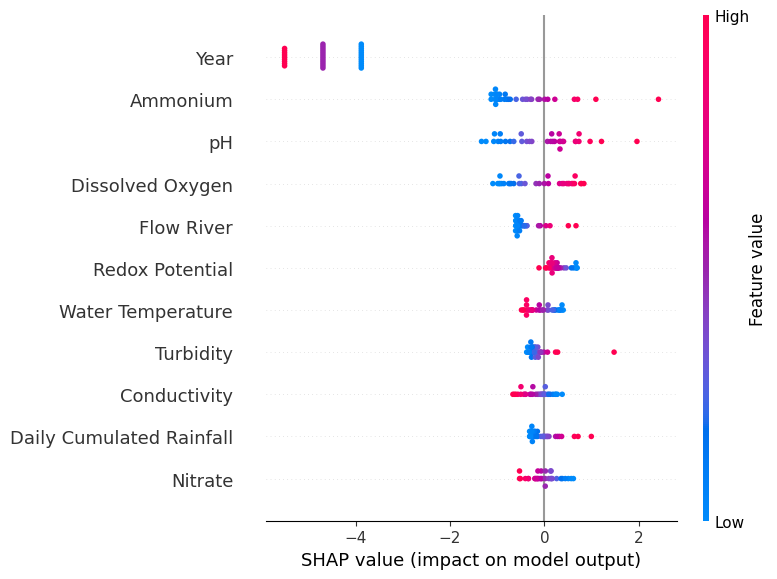

In [136]:
shap.summary_plot(
    shap_values, X_test_fit, feature_names=X_test_fit.columns
)

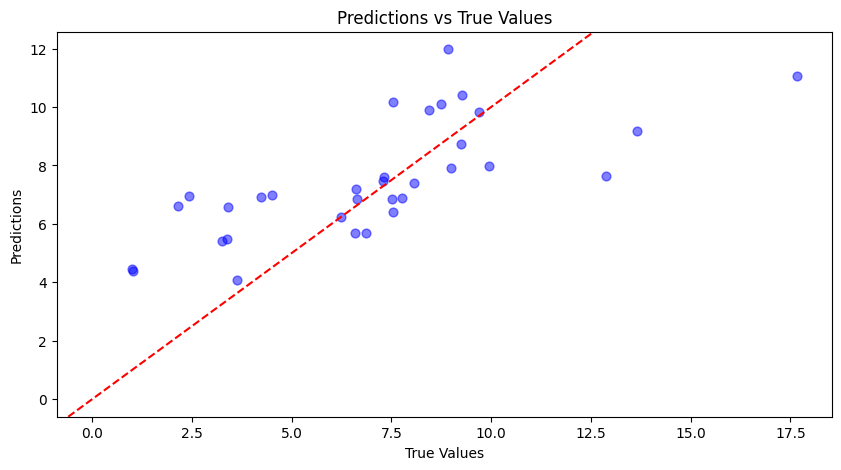

In [137]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

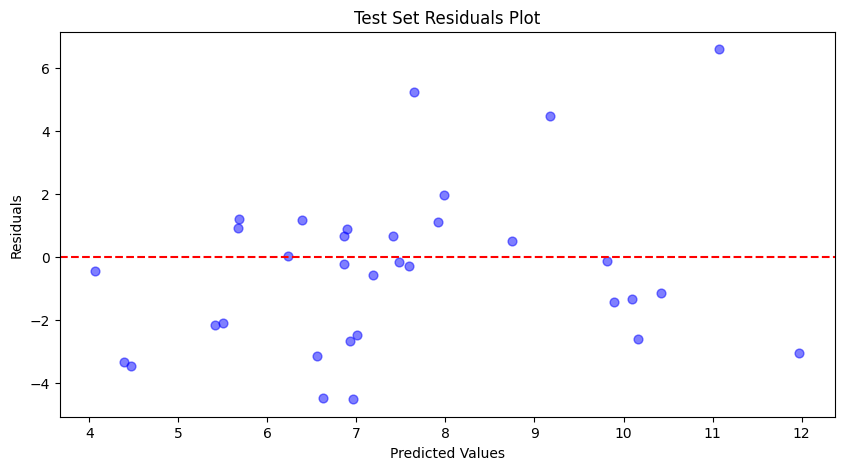

In [138]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

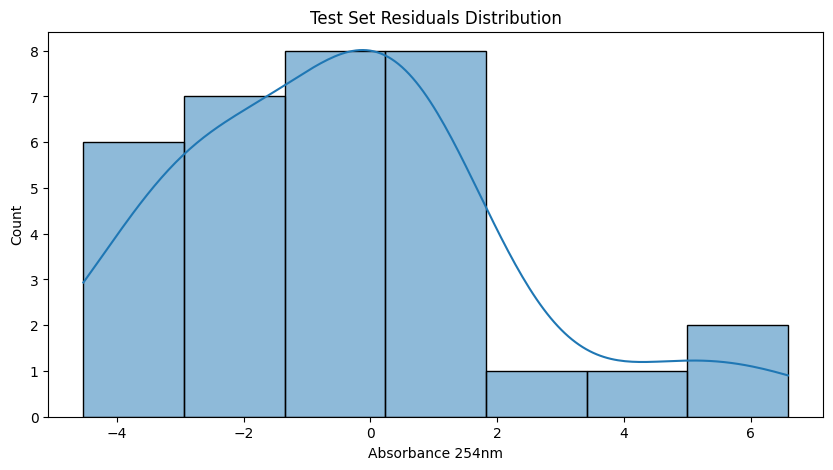

In [139]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [140]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

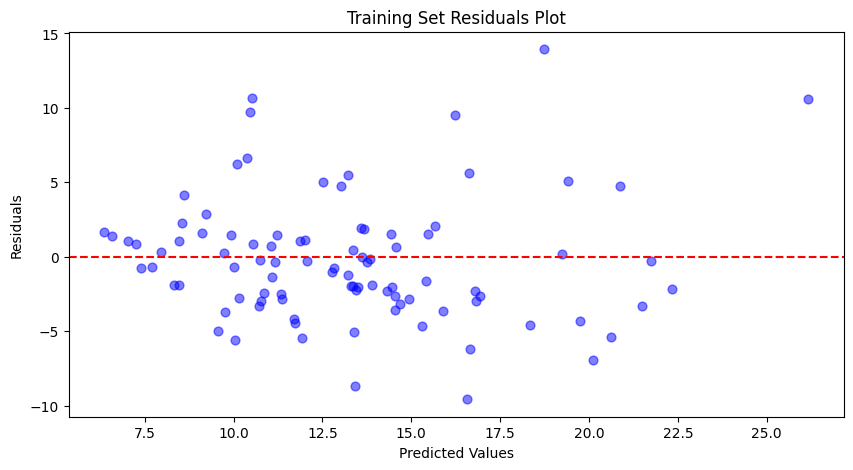

In [141]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(
    train_predictions.flatten(), train_residuals, c="b", s=40, alpha=0.5
)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

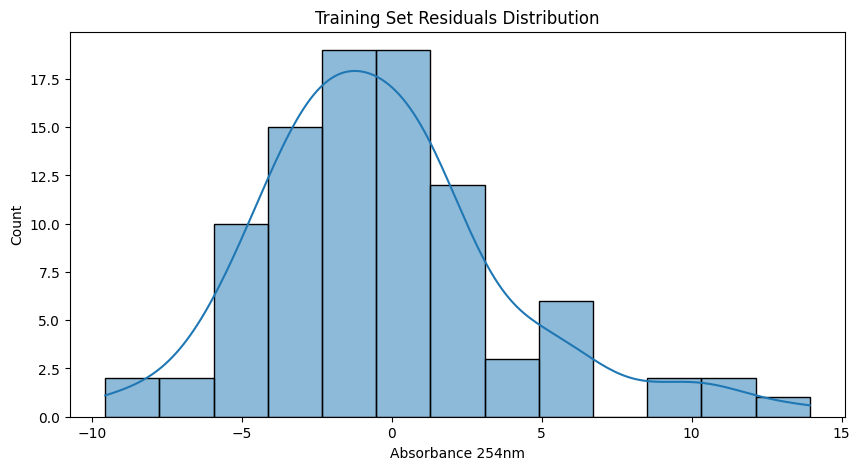

In [142]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

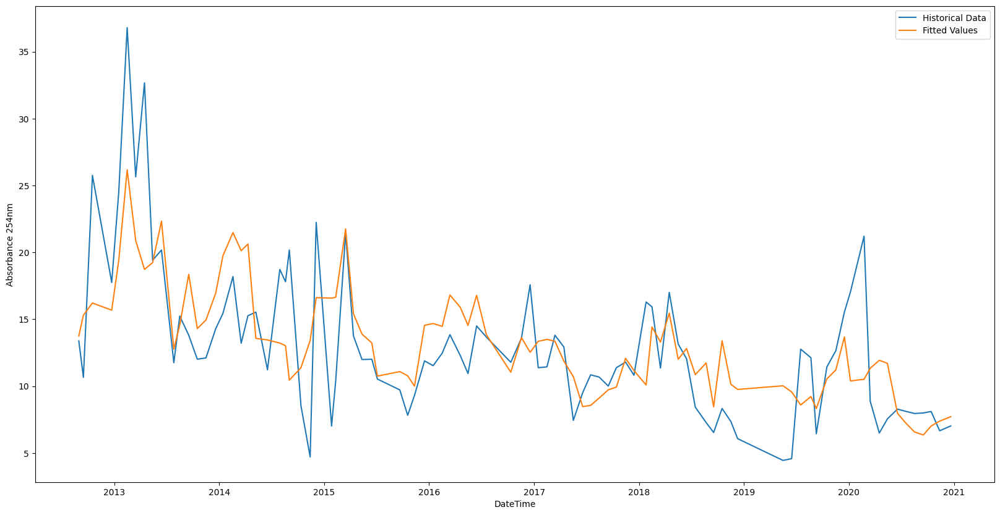

In [143]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

plt.show()

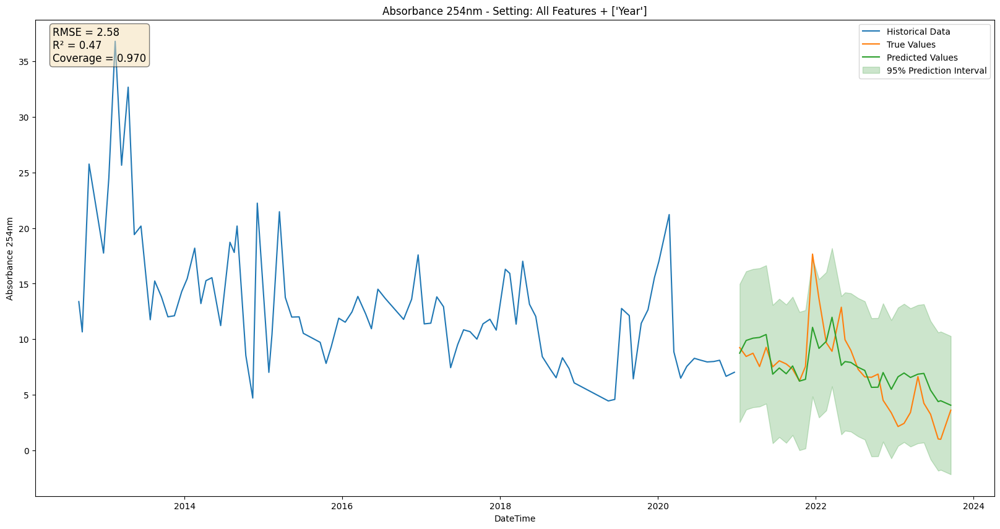

In [144]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test_fit["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test_fit["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test_fit["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

## Store Results

In [145]:
nn_pred = y_med
nn_lower_bound = y_lower
nn_upper_bound = y_upper
nn_rmse = rmse
nn_r2 = r2

# Final Plot

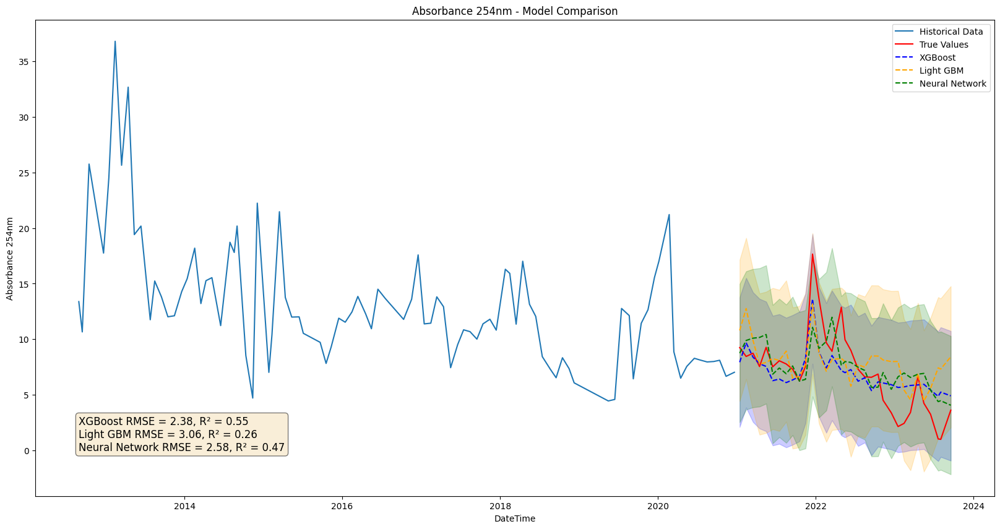

In [152]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=boost_pred,
    label="XGBoost",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    boost_lower_bound,
    boost_upper_bound,
    alpha=0.2,
    color="blue",
)

# Random Forest
sns.lineplot(
    x=y_test["DateTime"],
    y=lgbm_pred,
    label="Light GBM",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    lgbm_lower_bound,
    lgbm_upper_bound,
    alpha=0.2,
    color="orange",
)

# Neural Network
sns.lineplot(
    x=y_test["DateTime"],
    y=nn_pred,
    label="Neural Network",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    nn_lower_bound,
    nn_upper_bound,
    alpha=0.2,
    color="green",
)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"XGBoost RMSE = {boost_rmse:.2f}, R\u00b2 = {boost_r2:.2f}",
        f"Light GBM RMSE = {lgbm_rmse:.2f}, R\u00b2 = {lgbm_r2:.2f}",
        f"Neural Network RMSE = {nn_rmse:.2f}, R\u00b2 = {nn_r2:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0],
    0,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Model Comparison")

plt.legend()
plt.show()

NameError: name 'lr_pred' is not defined

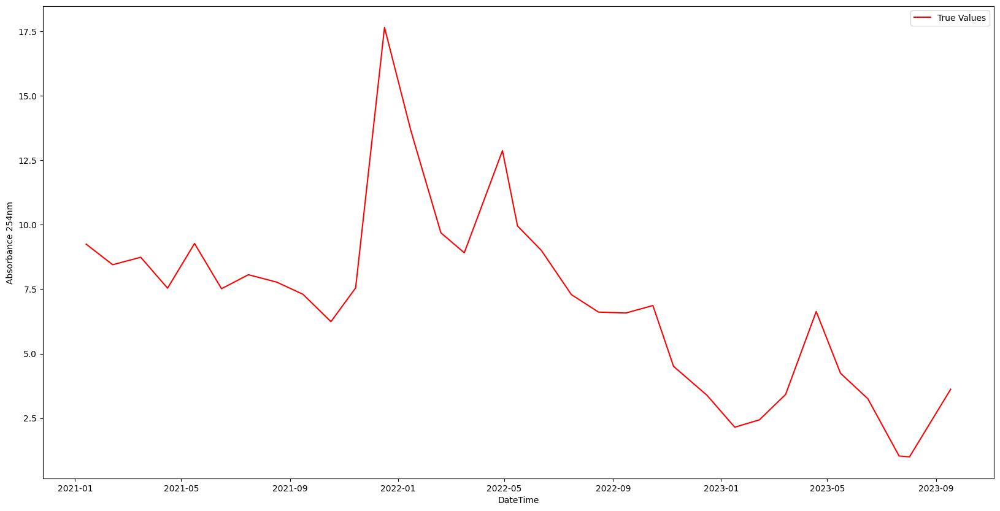

In [147]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
# sns.lineplot(x=y_train['DateTime'], y=y_train['Absorbance 254nm'], label='Historical Data')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=lr_pred,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    lr_lower_bound,
    lr_upper_bound,
    alpha=0.2,
    color="blue",
)

# Random Forest
sns.lineplot(
    x=y_test["DateTime"],
    y=rf_pred,
    label="Random Forest",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    rf_lower_bound,
    rf_upper_bound,
    alpha=0.2,
    color="orange",
)

# Neural Network
sns.lineplot(
    x=y_test["DateTime"],
    y=nn_pred,
    label="Neural Network",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    nn_lower_bound,
    nn_upper_bound,
    alpha=0.2,
    color="green",
)

# change the y range to see the differences
plt.ylim(-5, 41)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm (un.Abs/m)")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"Linear Regression RMSE = {lr_rmse:.2f}",
        f"Random Forest RMSE = {rf_rmse:.2f}",
        f"Neural Network RMSE = {nn_rmse:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    36,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm (un.Abs/m) - Model Comparison")

plt.legend()
plt.show()